# Imports and data loading

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import cmasher as cmr

from astropy.io import fits
from astropy.coordinates import SkyCoord, match_coordinates_sky
from astropy.stats import bootstrap
import astropy.units as u

from PIL import Image
from matplotlib.colors import LogNorm

import os
from pathlib import Path
import requests
from tqdm.notebook import tqdm

from astropy.cosmology import FlatLambdaCDM
import astropy.units as u

cosmo = FlatLambdaCDM(H0=70, Om0=0.3)

ROOT = Path('..').resolve()
results_dir = ROOT/'results/'
fig_dir = results_dir/'xSAGA-medium/figures/'

c0, c1, c2, c3, c4 = '#003f5c', '#58508d', '#bc5090', '#ff6361', '#ffa600'

In [3]:
adf = pd.read_csv(results_dir/'predictions-dr9.csv', index_col='objID')
sdf = adf[adf.p_CNN > 0.5].copy()

adf.shape, sdf.shape

/home/john/anaconda3/envs/xSAGA/lib/python3.8/site-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)


((4433095, 6), (116139, 6))

In [4]:
def load_NSA():
    """Returns dataframe with some NSA info.
    """
    nsa = fits.getdata(ROOT/'data/nsa_v1_0_1.fits')

    # do this column by column, *not* on entire catalog
    byteorder = lambda x: x.byteswap().newbyteorder()

    # doesn't use .byteswap().newbyteorder() because that's super slow...
    return pd.DataFrame({
        'NSAID': byteorder(nsa.NSAID),
        'z_NSA': byteorder(nsa.Z),
        'ra_NSA': byteorder(nsa.RA),
        'dec_NSA': byteorder(nsa.DEC),
        'M_r_NSA': byteorder(nsa.ELPETRO_ABSMAG[:, 4]),
        'mass_NSA': byteorder(nsa.ELPETRO_MASS)
    })

nsa = load_NSA().set_index('NSAID')

**Other data products created in the sections below:**


In [5]:
# Section 3.1 (NSA crossmatch with satellites)
sat_x_nsa = pd.read_csv(results_dir/'xSAGA-medium/sat_x_NSA.csv', index_col=0)

# Section 4.2 (hosts, corrected for duplicates)
host_df = pd.read_csv(results_dir/'xSAGA-medium/host_df.csv', index_col=0)

# Section 4.2 (satellites, assigned to hosts, crossmatched with NSA) -- includes satellite-host separations
# shdf = pd.read_csv(results_dir/'xSAGA-medium/sats_hosts_x_nsa.csv', index_col=0)

# Section 7 (hosts, incorrectly *not* corrected for duplicate matches)
overcounted_host_df = pd.read_csv(results_dir/'xSAGA-medium/overcounted_host_df.csv')

# Section 12 (satellites, assigned to hosts) -- includes satellite mass, physical radius, etc., assuming host redshift
shdf = pd.read_csv(results_dir/'xSAGA-medium/sats_hosts_x_nsa.csv', index_col=0)

# Section 13 (satellites in hosts) -- volume limited using a absolute magnitude (M_r) cut < -12.3 
vldf = pd.read_csv(results_dir/'xSAGA-medium/volume-limited-satellites.csv', index_col=0)

# The big picture

## Spatial distribution by CNN satellite probability

In [ ]:
plt.figure(figsize=(12, 8), dpi=300)
plt.scatter(adf.ra, adf.dec, edgecolor='none', s=0.1, c='k', alpha=0.1)

sc = plt.scatter(sdf.ra, sdf.dec, c=sdf.p_CNN, edgecolor='none', s=(sdf.r0/20)**-4, cmap='cmr.ember_r', vmin=0.5, vmax=1.)

plt.colorbar(sc, label='Satellite probability')

plt.xlim(240, 120)
plt.ylim(0, 60)

plt.xlabel('RA')
plt.ylabel('Dec');

plt.savefig(fig_dir/'positions-satellites.png')

## Spatial distribution of red and blue galaxies

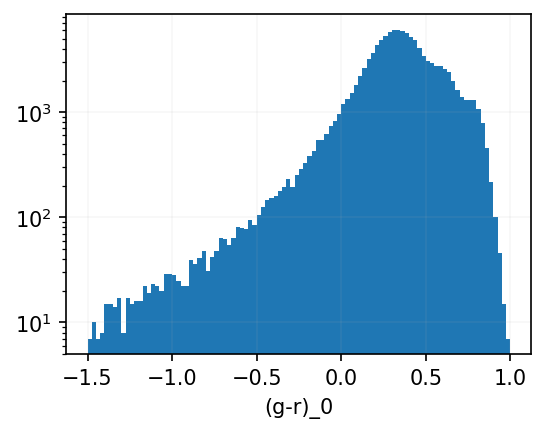

In [200]:
sdf['gr'] = sdf.g0 - sdf.r0

plt.figure(figsize=(4,3), dpi=150)
sdf.gr.hist(bins=100, range=[-1.5, 1], log=True)
plt.grid(alpha=0.1)
plt.xlabel(r'(g-r)_0');

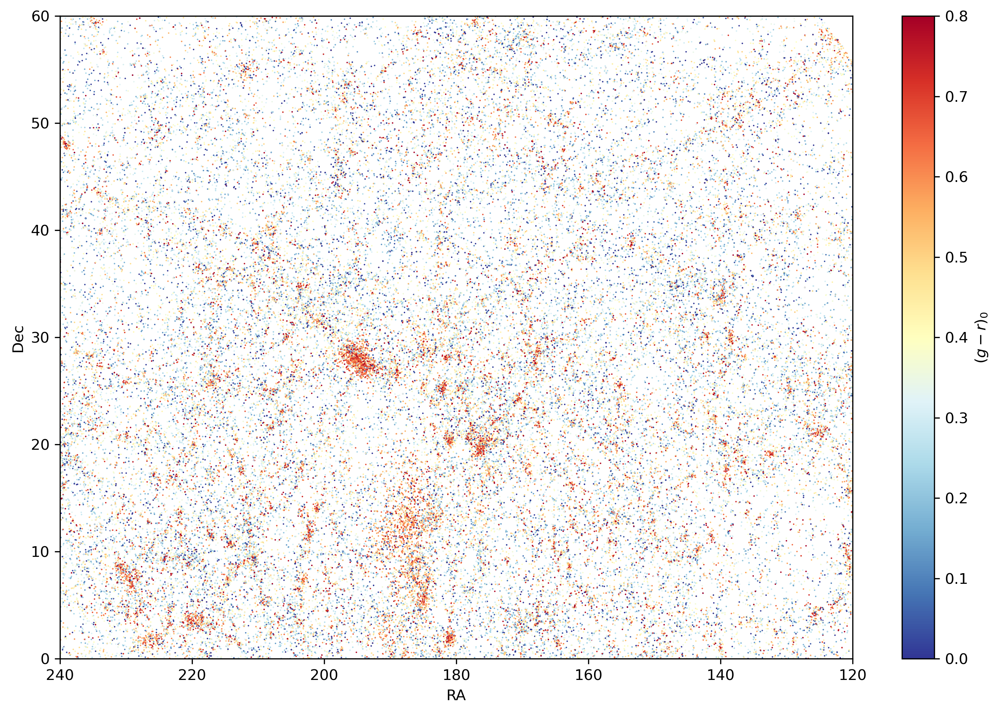

In [209]:
plt.figure(figsize=(12, 8), dpi=300)

sc = plt.scatter(sdf.ra, sdf.dec, edgecolor='none', s=1, c=sdf.gr, vmin=-0, vmax=0.8, cmap='RdYlBu_r')

plt.colorbar(sc, label=r'$(g-r)_0$')

plt.xlim(240, 120)
plt.ylim(0, 60)

plt.xlabel('RA')
plt.ylabel('Dec');

# plt.savefig(fig_dir/'positions-satellites_by_color.png')

## Spatial distribution of LSBGs

Below 23.5 mags/arcsec^2

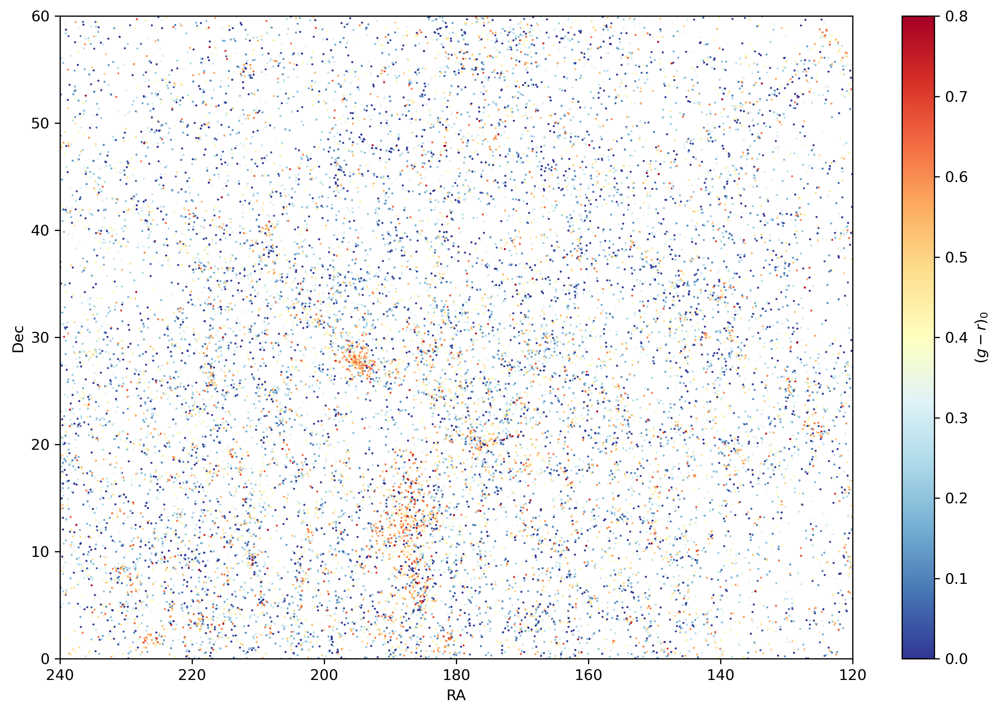

In [187]:
plt.figure(figsize=(12, 8), dpi=300)

# LSB galaxies!
sdf['mu_eff'] = sdf.r0 + 2.5*np.log10(2*np.pi*sdf.R_eff**2)
sdf['gr'] = sdf.g0 - sdf.r0

LSB_cut = 23.5

sc = plt.scatter(sdf[sdf.mu_eff > LSB_cut].ra, sdf[sdf.mu_eff > LSB_cut].dec, edgecolor='none', s=2, c=sdf[sdf.mu_eff > LSB_cut].gr, vmin=-0, vmax=0.8, cmap='RdYlBu_r')

plt.colorbar(sc, label=r'$(g-r)_0$')

plt.xlim(240, 120)
plt.ylim(0, 60)

plt.xlabel('RA')
plt.ylabel('Dec');

Below 24 mags/arcsec^2

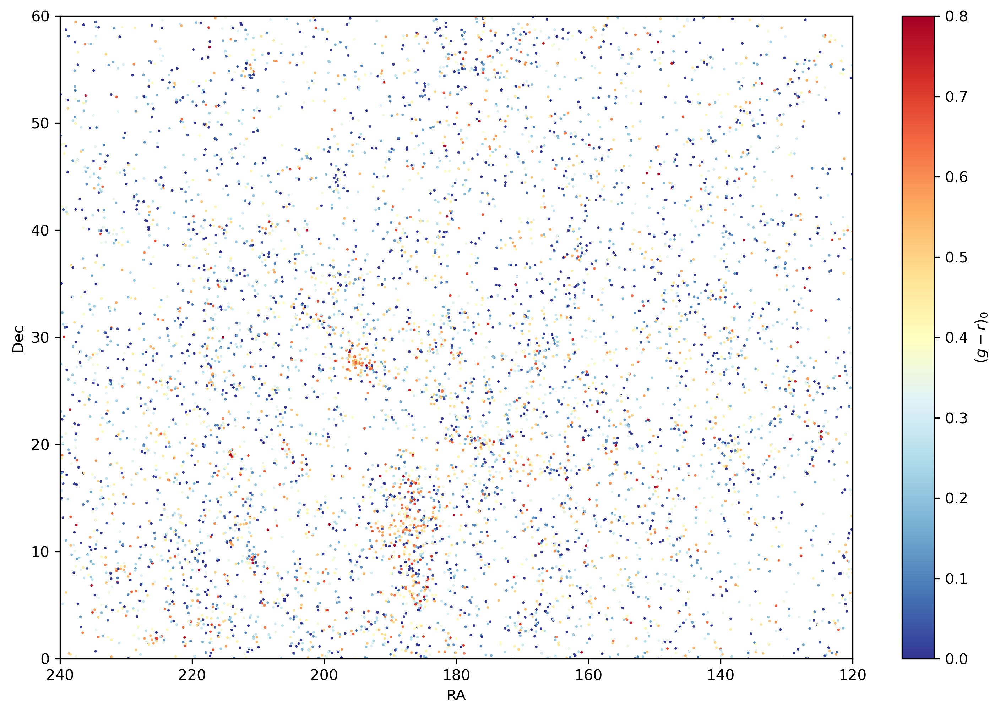

In [189]:
plt.figure(figsize=(12, 8), dpi=300)

sdf['mu_eff'] = sdf.r0 + 2.5*np.log10(2*np.pi*sdf.R_eff**2)
sdf['gr'] = sdf.g0 - sdf.r0

LSB_cut = 24.

sc = plt.scatter(sdf[sdf.mu_eff > LSB_cut].ra, sdf[sdf.mu_eff > LSB_cut].dec, edgecolor='none', s=3, c=sdf[sdf.mu_eff > LSB_cut].gr, vmin=-0, vmax=0.8, cmap='RdYlBu_r')

plt.colorbar(sc, label=r'$(g-r)_0$')

plt.xlim(240, 120)
plt.ylim(0, 60)

plt.xlabel('RA')
plt.ylabel('Dec');

# NSA crossmatch

In [27]:
sdf.dropna(inplace=True)
sdf.shape

(116124, 6)

In [20]:
nsa = fits.getdata(ROOT/'data/nsa_v1_0_1.fits')

nsa_z = nsa.Z
nsa_ra = nsa.RA
nsa_dec = nsa.DEC
nsa_mag = nsa.ELPETRO_ABSMAG[:, 4]

nsa_lowz = nsa_z < 0.03


In [28]:
nsa_coords_lowz = SkyCoord(nsa_ra[nsa_lowz], nsa_dec[nsa_lowz], unit='deg')
sat_coords = SkyCoord(sdf.ra, sdf.dec, unit='deg')

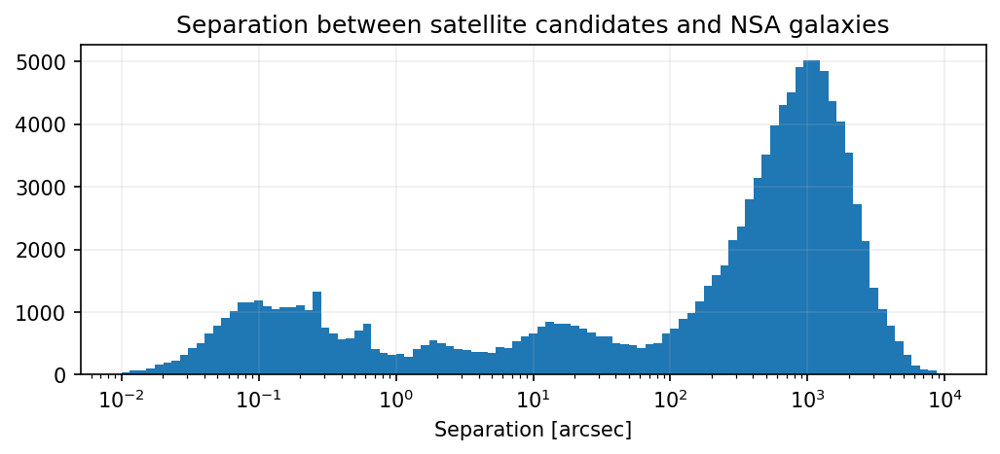

In [29]:
nsa_idx, sep, _ = sat_coords.match_to_catalog_sky(nsa_coords_lowz)
sep = sep.to('arcsec').value

plt.figure(figsize=(8,3), dpi=150)
plt.hist(sep, bins=np.logspace(-2, 4, num=100))
plt.xscale('log')
plt.xlabel('Separation [arcsec]')
plt.title('Separation between satellite candidates and NSA galaxies')
plt.grid(alpha=0.2);

These bumps in the distribution are probably

| Ang dist ["] | Dist [pkpc] at z=0.02 | Description                     |
|--------------|-----------------------|---------------------------------|
| $\sim 0.1$   | 0.04                  | NSA-satellite self-matches      |
| $\sim 2$     | 0.8                   | Also self-matches (?)           |
| $\sim 20$    | 8                     | Shredded low-$z$ host matches   | 
| $\sim 1000$  | 400                   | Actual satellite-host matches   |

For now, we'll reject the shreds using a constant 60 arcsec cut.

In [30]:
len(nsa_idx), len(np.unique(nsa_idx)), len(np.unique(nsa_idx[sep>60]))

(116124, 38564, 28066)

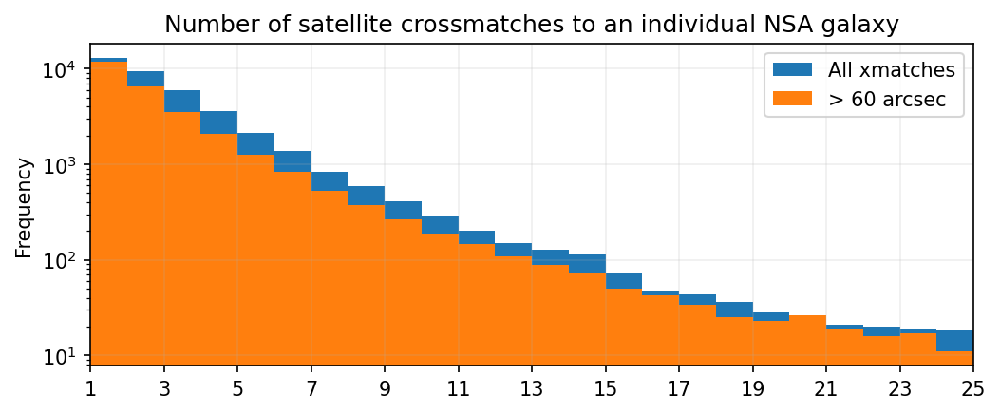

In [45]:
plt.figure(figsize=(8,3), dpi=150)
pd.Series(nsa_idx).value_counts().plot.hist(bins=25, range=(1,26), log=True, label='All xmatches')
pd.Series(nsa_idx[sep>60]).value_counts().plot.hist(bins=25, range=(1,26), log=True, label='> 60 arcsec')

plt.xlim(1, 25);
plt.xticks(np.arange(1, 26, 2))
plt.title('Number of satellite crossmatches to an individual NSA galaxy')
plt.legend()
plt.grid(alpha=0.2)

plt.savefig(fig_dir/'nsa-satellite-number_of_crossmatches.png')

## Save crossmatches as `sat_x_nsa`

In [46]:
sat_x_nsa = sdf.copy()

sat_x_nsa['z_NSA'] = nsa_z[nsa_lowz][nsa_idx]
sat_x_nsa['M_r_NSA'] = nsa_mag[nsa_lowz][nsa_idx]
sat_x_nsa['sep_NSA'] = sep
sat_x_nsa['ra_NSA'] = nsa_ra[nsa_lowz][nsa_idx]
sat_x_nsa['dec_NSA'] = nsa_dec[nsa_lowz][nsa_idx]

sat_x_nsa.sample(10, random_state=42)

,p_CNN,ra,dec,g0,r0,R_eff,z_NSA,M_r_NSA,sep_NSA,ra_NSA,dec_NSA
objID,,,,,,,,,,,
1237666463192908087,0.635811,120.802370,65.311918,17.24775,17.09686,3.223088,0.016388,-20.119474,4587.292818,119.339115,66.437175
1237651736313987722,0.678116,226.078874,1.755383,18.19375,17.61009,8.070174,0.006127,-16.359915,845.954397,226.035268,1.524474
1237662195068174371,0.783533,199.697972,41.942603,20.53529,20.59862,1.070660,0.004162,-17.095476,36.857233,199.688077,41.949721
1237658612513374258,0.996719,154.969513,45.554685,13.86206,13.88730,26.679640,0.002226,-19.309755,29.781533,154.979024,45.549779
1237668332033867806,0.858927,233.738090,11.742631,20.05388,19.69413,2.146475,0.006302,-19.039938,34.290192,233.743916,11.750259
1237667550344970448,0.587800,164.561377,23.413925,15.84125,15.23272,5.052895,0.021248,-16.564194,1010.792678,164.567436,23.694646
1237667538000085861,0.534953,133.196314,16.285791,20.39425,20.23060,2.061640,0.029655,-17.644138,798.054018,133.268867,16.075344
1237651735757258774,0.978411,180.674897,1.980598,14.56962,14.97351,22.003270,0.006542,-20.048975,14.251140,180.676020,1.976802
1237661949730226306,0.953022,214.220625,10.807425,12.50191,11.65676,14.396340,0.024712,-22.456387,0.071821,214.220637,10.807410


In [48]:
# sat_x_nsa.to_csv(results_dir/'xSAGA-medium/sat_x_NSA.csv', index=True)

## Visualize sats and (NSA) hosts

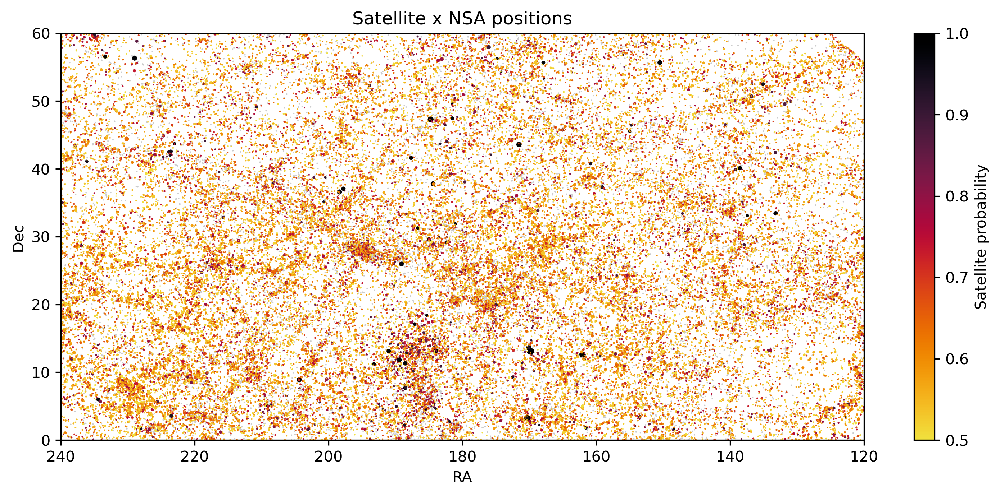

In [53]:
plt.figure(figsize=(12, 5), dpi=300)

xmatch = (sat_x_nsa.sep_NSA < 1.).values  # hosts
smatch = (sat_x_nsa.sep_NSA > 60.).values # satellites
plt.scatter(sat_x_nsa[xmatch].ra, sat_x_nsa[xmatch].dec, c='0.8', edgecolor='none', s=1)

sc = plt.scatter(sat_x_nsa[smatch].ra, sat_x_nsa[smatch].dec, c=sat_x_nsa[smatch].p_CNN, edgecolor='none', s=(sat_x_nsa[smatch].r0/20)**-4, cmap='cmr.ember_r', vmin=0.5, vmax=1.)
plt.colorbar(sc, label='Satellite probability')

plt.xlim(240, 120)
plt.ylim(0, 60)      


plt.title('Satellite x NSA positions')
plt.xlabel('RA')
plt.ylabel('Dec');

In case you're wondering what's going on around RA, Dec = (187, 11), that's basically the Virgo cluster! The overdensity near (195, 28.5) is the Coma cluster. The cluster around (176, 20) is the Leo cluster (never heard of it), and the cluster around (230, 8.5) is Abell 2063.

## Visualize some high-probability sources

Using Yao's tool: https://yymao.github.io/decals-image-list-tool/

In [66]:
# NSA crossmatches
(sat_x_nsa[(sat_x_nsa.sep_NSA < 1) & (sat_x_nsa.r0 > 19)]
 .sort_values('p_CNN', ascending=False)[['ra', 'dec']]
 .head(20)
)

,ra,dec
objID,,
1237650760242233507,178.131647,-3.673640
1237678600231715120,0.522883,16.588958
1237660344469487779,135.117668,35.669417
1237659119327969469,229.812496,44.916047
1237661351631716611,177.374137,56.031490
1237667444581400597,184.180271,28.731013
1237667911132446909,190.850433,24.524087
1237657855536005240,179.508853,51.349393
1237661976547557547,185.770161,8.333256


In [63]:
# farther away... (almost everything is shredded though)
(sat_x_nsa[(sat_x_nsa.sep_NSA > 600) & (sat_x_nsa.r0 > 19)]
 .sort_values('p_CNN', ascending=False)[['ra', 'dec']]
 .head(20)
)

,ra,dec
objID,,
1237667781773099469,214.347658,19.200562
1237667781773099472,214.349604,19.196872
1237667782309839746,214.045674,19.481861
1237658629159518245,189.447217,11.826169
1237658629159452801,189.425419,11.827075
1237661813878947928,169.726846,13.111381
1237658629159452807,189.415170,11.819433
1237668273513824408,213.978477,18.805455
1237648704579174453,188.163594,0.113617


In [71]:
# pretty good candidates! these have something like `p_CNN` ~ 0.75
(sat_x_nsa[(sat_x_nsa.sep_NSA > 60) & (sat_x_nsa.r0 > 19)]
 .sort_values('p_CNN', ascending=False)[['ra', 'dec']]
 .iloc[1000:1020]
)

,ra,dec
objID,,
1237654030330364460,175.654143,2.875546
1237665330385387874,174.625884,32.154821
1237651736849875313,223.789653,2.310156
1237654871597187278,125.192400,-1.417642
1237648720160489935,187.977492,-0.968134
1237649919501599227,12.637436,14.627837
1237668495242625543,170.313927,16.581879
1237674649929384568,181.587529,-0.290299
1237648721771758080,189.452309,0.319655


In [76]:
# still pretty convincing `p_CNN` ~ 0.65
(sat_x_nsa[(sat_x_nsa.sep_NSA > 60) & (sat_x_nsa.r0 > 19)]
 .sort_values('p_CNN', ascending=False)[['ra', 'dec']]
 .iloc[5000:5020]
)

,ra,dec
objID,,
1237659897788957240,267.735222,47.411792
1237665126948602450,224.911611,26.995012
1237657874866962795,142.957226,42.204768
1237665583258468673,258.389949,41.361327
1237678433256014531,9.972348,3.182691
1237652947453739530,4.258965,-10.199738
1237664871362003322,145.884817,33.449347
1237664854174597583,198.097571,37.616155
1237666339724656917,13.813131,0.241030


# Assign sats to hosts

## Examine separations

In [80]:
sat_coords = SkyCoord(sat_x_nsa.ra, sat_x_nsa.dec, unit='deg')

nsa = load_NSA().set_index('NSAID')
nsa_coords = SkyCoord(nsa.ra_NSA, nsa.dec_NSA, unit='deg')

_, angsep, _ = nsa_coords.match_to_catalog_sky(sat_coords)

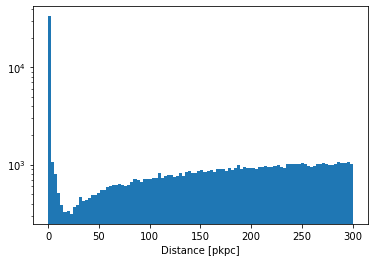

In [107]:
# separations in projected kpc
sep = (cosmo.angular_diameter_distance(nsa.z_NSA).to(u.kpc) * angsep.to(u.rad)).value

# plot distribution of satellite-host separations for hosts at z > 0.005
plt.hist(sep[(nsa.z_NSA > 0.005)], bins=100, range=[0, 300], log=True);
plt.xlabel('Distance [pkpc]');

Cut out satellite candidates separated **< 25 kpc** or **>300 kpc** from an NSA host.

Also, we'll only consider **hosts with stellar mass** > $10^9$ (and less than $10^{14}$) solar masses. 

This is a bit under the mass of the SMC...


In [108]:
hosts = nsa[sep < 300].copy()
hosts = hosts[(hosts.mass_NSA < 1e14) & (hosts.mass_NSA > 1e9) & (hosts.z_NSA < 0.03) & (hosts.z_NSA > 0.005)].copy()

hosts.sort_values('mass_NSA', ascending=False, inplace=True)

len(hosts)

20927

## Perform halo-sat assignment, `host_df`, corrected for duplicates

Start with most massive hosts and work our way down, but now keep track of which host each satellite goes in. Save these host NSAIDs to the satellite dataframe.

The 25 kpc minimum radius removes self-matches... I hope.

In [124]:
host_dict = dict()

host_NSAID = -1 * np.ones(len(sat_x_nsa), dtype=int)
distances = -1 * np.ones(len(sat_x_nsa), dtype=float)

for host in tqdm(hosts.itertuples(), total=len(hosts)):
    nsaid, z, ra, dec, M_r, mass = host
    
    host_coords = SkyCoord(ra, dec, unit='deg')
    host_sep = host_coords.separation(sat_coords)
    
    kpc_per_deg = cosmo.angular_diameter_distance(z).to(u.kpc).value * np.pi / 180 

    # note: could change 300 kpc to something that scales with host mass 
    in_host = (host_sep.to(u.deg).value * kpc_per_deg < 300) & (host_sep.to(u.deg).value * kpc_per_deg > 25)
    new_idxs = in_host & (host_NSAID == -1)    
    
    new_sats_in_host = sat_x_nsa[new_idxs]
    
    host_NSAID[new_idxs] = nsaid 
    distances[new_idxs] = host_sep[new_idxs] * kpc_per_deg
    
    n_sat_in_300kpc = len(new_sats_in_host)
    host_dict[nsaid] = [ra, dec, z, M_r, mass, n_sat_in_300kpc]


In [167]:
sat_x_nsa['host_distance'] = distances
sat_x_nsa['host_NSAID'] = host_NSAID

shdf = sat_x_nsa.join(hosts, on='host_NSAID', how='left', rsuffix='_HOST')

In [169]:
# sats-hosts_x_nsa
# shdf.to_csv(results_dir/'xSAGA-medium/sats_hosts_x_nsa.csv')

In [125]:
host_df = pd.DataFrame.from_dict(
    host_dict, 
    orient='index', 
    columns=['ra', 'dec', 'z', 'M_r', 'mass', 'n_sat_in_300kpc'],
)
host_df.index.name = 'NSAID'
host_df.sample(5, random_state=42)

,ra,dec,z,M_r,mass,n_sat_in_300kpc
NSAID,,,,,,
446565,172.873541,35.895219,0.024274,-17.825983,1.092958e+09,2
489020,132.073674,16.959288,0.028382,-19.498116,5.867899e+09,0
121632,330.454941,13.638136,0.024767,-19.258118,5.474809e+09,1
620286,44.118168,4.610461,0.027072,-20.481339,1.570739e+10,0
152608,203.999721,3.639137,0.022775,-18.178537,1.169333e+09,2


Save progress

In [126]:
# host_df.to_csv(results_dir/'xSAGA-medium/host_df.csv')

# Host-satellite occupation

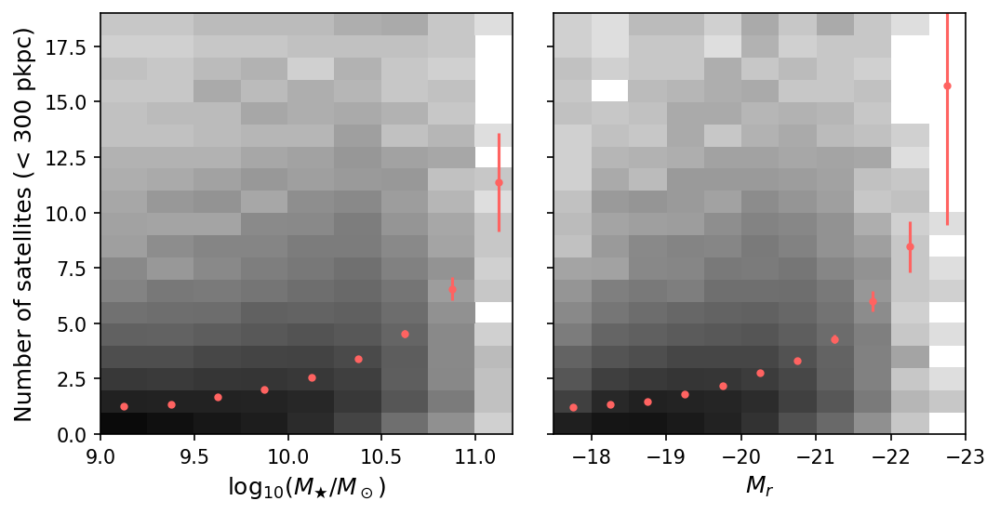

In [29]:
fig, [ax1, ax2] = plt.subplots(1, 2, figsize=(8, 4), dpi=150, sharey=True)

# plot stellar mass
mass_bins = np.arange(9., 11.5, 0.25)
ax1.hist2d(host_df.mass.apply(np.log10), host_df.n_sat_in_300kpc, bins=(mass_bins, np.arange(0, 20)), cmap='Greys', norm=LogNorm(0.1, 3e3))

boot_n_sat = np.array([
    bootstrap(
        host_df.n_sat_in_300kpc[(host_df.mass > 10**m1) & (host_df.mass < 10**m2)].values,
        bootfunc=np.mean,
    ) for m1, m2 in zip(mass_bins[:-1], mass_bins[1:])]
)

ax1.errorbar(mass_bins[:-1]+0.125, boot_n_sat.mean(1), boot_n_sat.std(1), c=c3, marker='o', ls='', markersize=3)

ax1.set_xlim(9.0, 11.2)
ax1.set_ylim(-0.5, 20.5)
ax1.set_xlabel(r'$\log_{10}(M_★/M_\odot)$', fontsize=12)
ax1.set_ylabel('Number of satellites (< 300 pkpc)', fontsize=12);

# plot abs mag
mag_bins = np.arange(-23., -17, 0.5)

ax2.hist2d(host_df.M_r, host_df.n_sat_in_300kpc, edgecolors='none', bins=(mag_bins, np.arange(0, 20)), cmap='Greys', norm=LogNorm(0.1, 3e3))

boot_n_sat = np.array([
    bootstrap(
        host_df.n_sat_in_300kpc[(host_df.M_r > mag1) & (host_df.M_r < mag2)].values,
        bootfunc=np.mean,
    ) for mag1, mag2 in zip(mag_bins[:-1], mag_bins[1:])]
)
ax2.errorbar(mag_bins[:-1]+.25, boot_n_sat.mean(1), boot_n_sat.std(1), c=c3, marker='o', ls='', markersize=3)

ax2.set_xlim(-17.5, -23.)
ax2.set_xlabel(r'$M_{r}$', fontsize=12)

fig.subplots_adjust(wspace=0.1)

plt.savefig(fig_dir/'nsats-per-host.png')

# Radial distribution of satellites

## Visualize with different mass bins

### Mass bins [9, 9.5, 10, 10.5, 11]

9995 7673
12618 6840
14871 5098
6278 1264
513 49


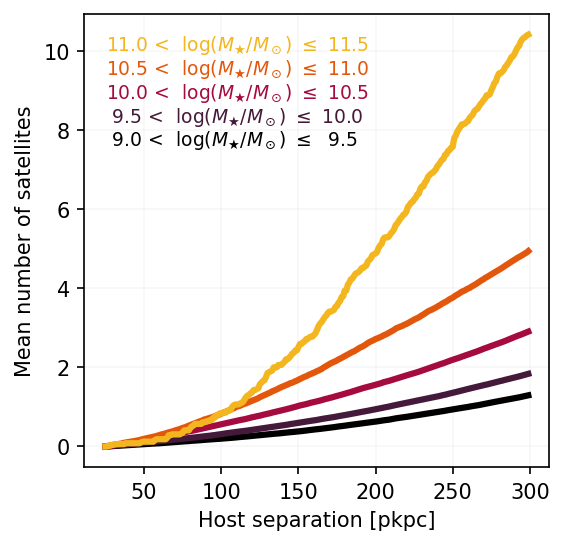

In [52]:
fig, ax = plt.subplots(1, 1, figsize=(4, 4), dpi=150)

radius_range = np.arange(25, 300, 1)

# loop through mass bins
for i, (m1, m2, color) in enumerate(
    zip(
        np.arange(9, 11.5, 0.5), 
        np.arange(9.5, 12, 0.5), 
        cmr.ember(np.linspace(0, 0.9, 5)), 
    )
):

    in_mass_range = (shdf.mass_NSA > 10**m1) & (shdf.mass_NSA <= 10**m2)

    N_sats = sum(in_mass_range)
    N_hosts = sum((host_df.mass > 10**m1) & (host_df.mass < 10**m2)) # number of hosts (including those that don't contain satellites)

    print(N_sats, N_hosts)

    cdf_sat = np.array([
        sum(shdf[in_mass_range].host_distance < r) / N_hosts \
            for r in radius_range
    ])
        
    ax.plot(radius_range, cdf_sat, color=color, lw=3)
    
    ax.text(25, 7.75+i*0.6, f'{m1:>4.1f} <  log($M_★/M_\odot$) $\leq$ {m2:>4.1f}', color=color, va='center',fontsize=9)
    
ax.set_xlabel('Host separation [pkpc]')
ax.set_ylabel('Mean number of satellites')

ax.grid(alpha=0.1)

plt.savefig(fig_dir/'satellite-radial-distribution_a.png')

### Mass bins [9, 9.4, 9.8, 10.2, 10.6, 11, 11.4]

8141 6244
8984 5585
11468 5074
10974 3216
4195 756
512 48


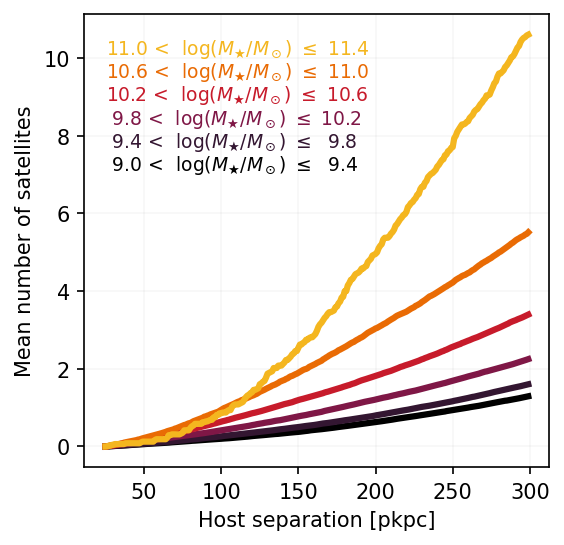

In [58]:
fig, ax = plt.subplots(1, 1, figsize=(4, 4), dpi=150)

radius_range = np.arange(25, 300, 1)

# loop through mass bins
for i, (m1, m2, color) in enumerate(
    zip(
        np.arange(9, 11.4, 0.4), 
        np.arange(9.4, 11.8, 0.4), 
        cmr.ember(np.linspace(0, 0.9, 6)), 
    )
):

    in_mass_range = (shdf.mass_NSA > 10**m1) & (shdf.mass_NSA <= 10**m2)

    N_sats = sum(in_mass_range)
    N_hosts = sum((host_df.mass > 10**m1) & (host_df.mass < 10**m2)) # number of hosts (including those that don't contain satellites)

    print(N_sats, N_hosts)

    cdf_sat = np.array([
        sum(shdf[in_mass_range].host_distance < r) / N_hosts \
            for r in radius_range
    ])
        
    ax.plot(radius_range, cdf_sat, color=color, lw=3)
    
    ax.text(25, 7.25+i*0.6, f'{m1:>4.1f} <  log($M_★/M_\odot$) $\leq$ {m2:>4.1f}', color=color, va='center',fontsize=9)
    
ax.set_xlabel('Host separation [pkpc]')
ax.set_ylabel('Mean number of satellites')

ax.grid(alpha=0.1)

plt.savefig(fig_dir/'satellite-radial-distribution_b.png')

### Mass bins [9, 9.25, ... 11.25]

5051 4046
4944 3627
5846 3459
6772 3381
7521 2931
7350 2167
4447 981
1831 283
495 43


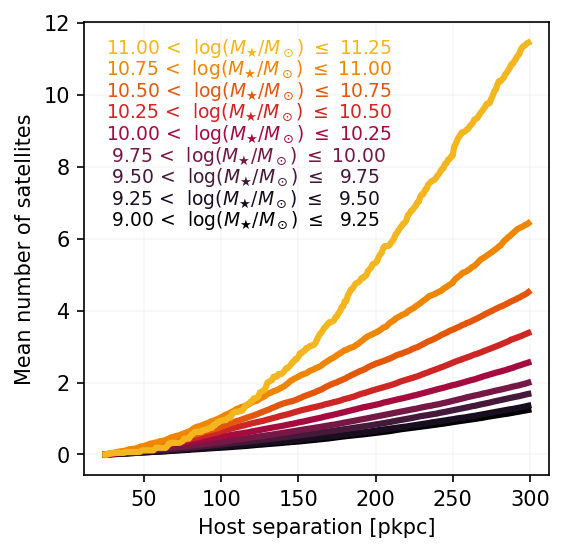

In [59]:
fig, ax = plt.subplots(1, 1, figsize=(4, 4), dpi=150)

radius_range = np.arange(25, 300, 1)

# loop through mass bins
for i, (m1, m2, color) in enumerate(
    zip(
        np.arange(9, 11.25, 0.25), 
        np.arange(9.25, 11.5, 0.25), 
        cmr.ember(np.linspace(0, 0.9, 9)), 
    )
):

    in_mass_range = (shdf.mass_NSA > 10**m1) & (shdf.mass_NSA <= 10**m2)

    N_sats = sum(in_mass_range)
    N_hosts = sum((host_df.mass > 10**m1) & (host_df.mass < 10**m2)) # number of hosts (including those that don't contain satellites)

    print(N_sats, N_hosts)

    cdf_sat = np.array([
        sum(shdf[in_mass_range].host_distance < r) / N_hosts \
            for r in radius_range
    ])
        
    ax.plot(radius_range, cdf_sat, color=color, lw=3)
    
    ax.text(25, 6.5+i*0.6, f'{m1:>5.2f} <  log($M_★/M_\odot$) $\leq$ {m2:>5.2f}', color=color, va='center',fontsize=9)
    
ax.set_xlabel('Host separation [pkpc]')
ax.set_ylabel('Mean number of satellites')

ax.grid(alpha=0.1)

plt.savefig(fig_dir/'satellite-radial-distribution_c.png')

## ~~Normalized radial distributions~~
See **Section 8.1.2** for better results.

### Normalized to the number at 300 kpc

8141 6244
8984 5585
11468 5074
10974 3216
4195 756
512 48


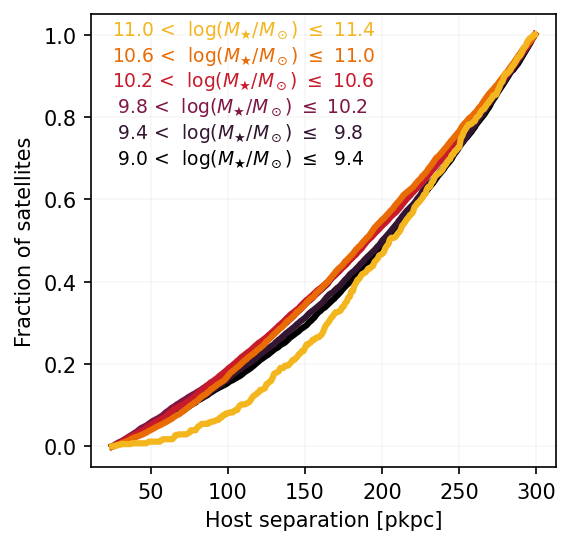

In [60]:
fig, ax = plt.subplots(1, 1, figsize=(4, 4), dpi=150)

radius_range = np.arange(25, 300, 1)

for i, (m1, m2, color) in enumerate(
    zip(
        np.arange(9, 11.4, 0.4), 
        np.arange(9.4, 11.8, 0.4), 
        cmr.ember(np.linspace(0, 0.9, 6)), 
    )
):

    in_mass_range = (shdf.mass_NSA > 10**m1) & (shdf.mass_NSA <= 10**m2)

    N_sats = sum(in_mass_range)
    N_hosts = sum((host_df.mass > 10**m1) & (host_df.mass < 10**m2)) # number of hosts (including those that don't contain satellites)

    print(N_sats, N_hosts)

    cdf_sat = np.array([
        sum(shdf[in_mass_range].host_distance < r) / N_hosts \
            for r in radius_range
    ])
        
    ax.plot(radius_range, cdf_sat / cdf_sat.max(), color=color, lw=3)
    
    ax.text(25, 0.7+i/16, f'{m1:>4.1f} <  log($M_★/M_\odot$) $\leq$ {m2:>4.1f}', color=color, va='center',fontsize=9)
    
ax.set_xlabel('Host separation [pkpc]')
ax.set_ylabel('Fraction of satellites')

ax.grid(alpha=0.1)

plt.savefig(fig_dir/'normalized_satellite-radial-distribution_a.png')

8141 6244
8984 5585
11468 5074
10974 3216
4195 756
512 48


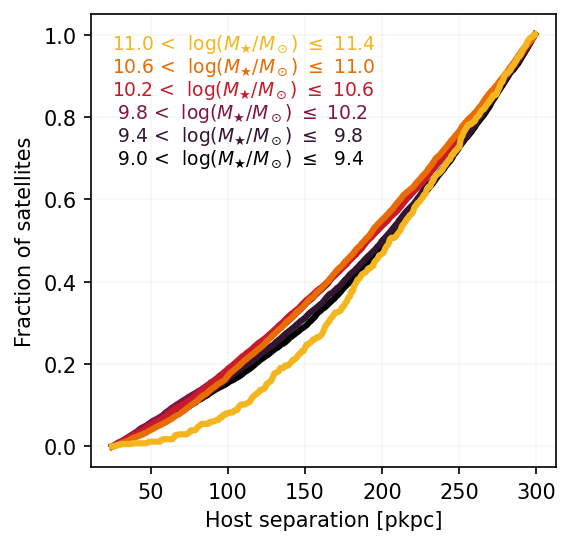

In [61]:
fig, ax = plt.subplots(1, 1, figsize=(4, 4), dpi=150)

radius_range = np.arange(25, 300, 1)

for i, (m1, m2, color) in enumerate(
    zip(
        np.arange(9, 11.4, 0.4), 
        np.arange(9.4, 11.8, 0.4), 
        cmr.ember(np.linspace(0, 0.9, 6)), 
    )
):

    in_mass_range = (shdf.mass_NSA > 10**m1) & (shdf.mass_NSA <= 10**m2)

    N_sats = sum(in_mass_range)
    N_hosts = sum((host_df.mass > 10**m1) & (host_df.mass < 10**m2)) # number of hosts (including those that don't contain satellites)

    print(N_sats, N_hosts)

    cdf_sat = np.array([
        sum(shdf[in_mass_range].host_distance < r) / N_hosts \
            for r in radius_range
    ])
        
    ax.plot(radius_range, cdf_sat / cdf_sat.max(), color=color, lw=3)
    
    ax.text(25, 0.7+i/18, f'{m1:>4.1f} <  log($M_★/M_\odot$) $\leq$ {m2:>4.1f}', color=color, va='center',fontsize=9)
    
ax.set_xlabel('Host separation [pkpc]')
ax.set_ylabel('Fraction of satellites')

ax.grid(alpha=0.1)

plt.savefig(fig_dir/'normalized_satellite-radial-distribution_b.png')

5051 4046
4944 3627
5846 3459
6772 3381
7521 2931
7350 2167
4447 981
1831 283
495 43


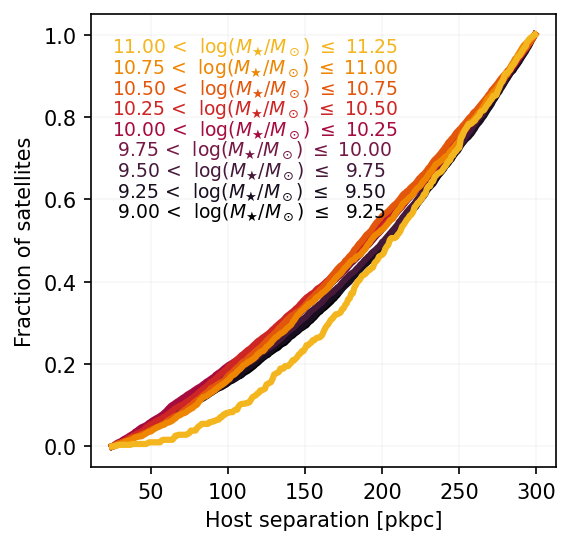

In [62]:
fig, ax = plt.subplots(1, 1, figsize=(4, 4), dpi=150)

radius_range = np.arange(25, 300, 1)

# loop through mass bins
for i, (m1, m2, color) in enumerate(
    zip(
        np.arange(9, 11.25, 0.25), 
        np.arange(9.25, 11.5, 0.25), 
        cmr.ember(np.linspace(0, 0.9, 9)), 
    )
):

    in_mass_range = (shdf.mass_NSA > 10**m1) & (shdf.mass_NSA <= 10**m2)

    N_sats = sum(in_mass_range)
    N_hosts = sum((host_df.mass > 10**m1) & (host_df.mass < 10**m2)) # number of hosts (including those that don't contain satellites)

    print(N_sats, N_hosts)

    cdf_sat = np.array([
        sum(shdf[in_mass_range].host_distance < r) / N_hosts \
            for r in radius_range
    ])
        
    ax.plot(radius_range, cdf_sat / cdf_sat.max(), color=color, lw=3)
    
    ax.text(25, 0.57+i/20, f'{m1:>5.2f} <  log($M_★/M_\odot$) $\leq$ {m2:>5.2f}', color=color, va='center',fontsize=9)
    
ax.set_xlabel('Host separation [pkpc]')
ax.set_ylabel('Fraction of satellites')

ax.grid(alpha=0.1)

plt.savefig(fig_dir/'normalized_satellite-radial-distribution_c.png')

### Normalized to the number at 150 kpc

8141 6244
8984 5585
11468 5074
10974 3216
4195 756
512 48


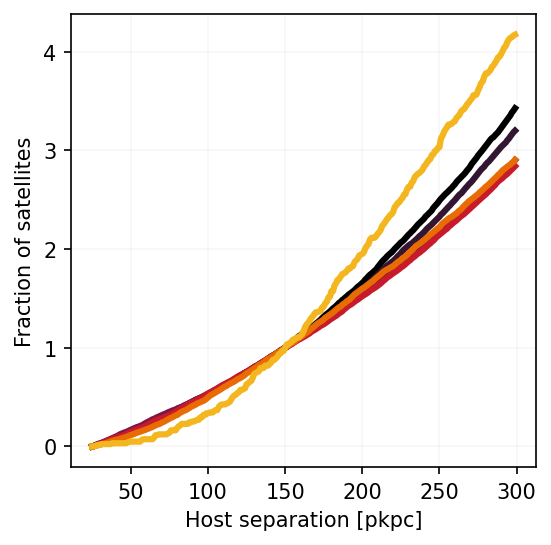

In [227]:
fig, ax = plt.subplots(1, 1, figsize=(4, 4), dpi=150)

radius_range = np.arange(25, 300, 1)

for i, (m1, m2, color) in enumerate(
    zip(
        np.arange(9, 11.4, 0.4), 
        np.arange(9.4, 11.8, 0.4), 
        cmr.ember(np.linspace(0, 0.9, 6)), 
    )
):

    in_mass_range = (shdf.mass_NSA > 10**m1) & (shdf.mass_NSA <= 10**m2)

    N_sats = sum(in_mass_range)
    N_hosts = sum((host_df.mass > 10**m1) & (host_df.mass < 10**m2)) # number of hosts (including those that don't contain satellites)

    print(N_sats, N_hosts)

    cdf_sat = np.array([
        sum(shdf[in_mass_range].host_distance < r) / N_hosts \
            for r in radius_range
    ])
        
    ax.plot(radius_range, cdf_sat / cdf_sat[np.abs((radius_range-150)).argmin()], color=color, lw=3)
    
    
ax.set_xlabel('Host separation [pkpc]')
ax.set_ylabel('Fraction of satellites')

ax.grid(alpha=0.1)

# plt.savefig(fig_dir/'normalized_satellite-radial-distribution_a.png')

8141 6244
8984 5585
11468 5074
10974 3216
4195 756
512 48


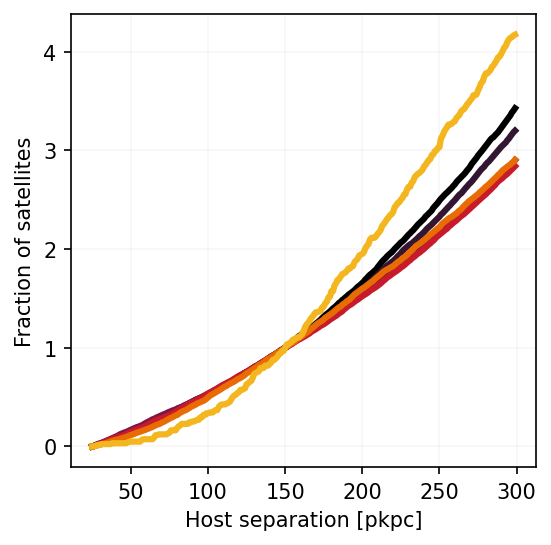

In [228]:
fig, ax = plt.subplots(1, 1, figsize=(4, 4), dpi=150)

radius_range = np.arange(25, 300, 1)

for i, (m1, m2, color) in enumerate(
    zip(
        np.arange(9, 11.4, 0.4), 
        np.arange(9.4, 11.8, 0.4), 
        cmr.ember(np.linspace(0, 0.9, 6)), 
    )
):

    in_mass_range = (shdf.mass_NSA > 10**m1) & (shdf.mass_NSA <= 10**m2)

    N_sats = sum(in_mass_range)
    N_hosts = sum((host_df.mass > 10**m1) & (host_df.mass < 10**m2)) # number of hosts (including those that don't contain satellites)

    print(N_sats, N_hosts)

    cdf_sat = np.array([
        sum(shdf[in_mass_range].host_distance < r) / N_hosts \
            for r in radius_range
    ])
        
    ax.plot(radius_range, cdf_sat / cdf_sat[np.abs((radius_range-150)).argmin()], color=color, lw=3)
    
    
ax.set_xlabel('Host separation [pkpc]')
ax.set_ylabel('Fraction of satellites')

ax.grid(alpha=0.1)


5051 4046
4944 3627
5846 3459
6772 3381
7521 2931
7350 2167
4447 981
1831 283
495 43


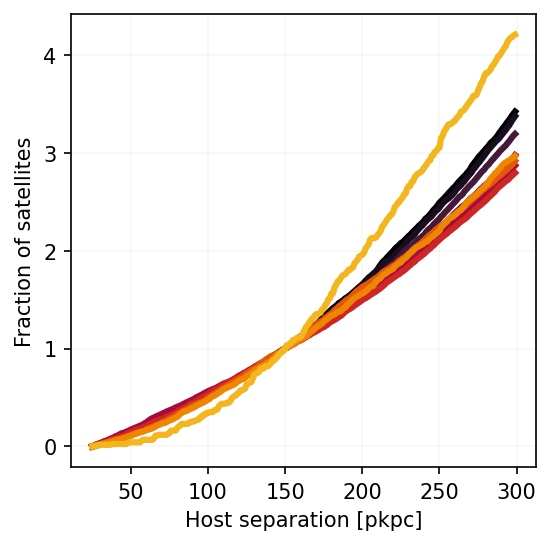

In [229]:
fig, ax = plt.subplots(1, 1, figsize=(4, 4), dpi=150)

radius_range = np.arange(25, 300, 1)

# loop through mass bins
for i, (m1, m2, color) in enumerate(
    zip(
        np.arange(9, 11.25, 0.25), 
        np.arange(9.25, 11.5, 0.25), 
        cmr.ember(np.linspace(0, 0.9, 9)), 
    )
):

    in_mass_range = (shdf.mass_NSA > 10**m1) & (shdf.mass_NSA <= 10**m2)

    N_sats = sum(in_mass_range)
    N_hosts = sum((host_df.mass > 10**m1) & (host_df.mass < 10**m2)) # number of hosts (including those that don't contain satellites)

    print(N_sats, N_hosts)

    cdf_sat = np.array([
        sum(shdf[in_mass_range].host_distance < r) / N_hosts \
            for r in radius_range
    ])
        
    ax.plot(radius_range, cdf_sat / cdf_sat[np.abs((radius_range-150)).argmin()], color=color, lw=3)
    

    
ax.set_xlabel('Host separation [pkpc]')
ax.set_ylabel('Fraction of satellites')

ax.grid(alpha=0.1)



## Log-log plots

**Might as well also look at the log-log slope**

9995 7673
12618 6840
14871 5098
6278 1264
513 49


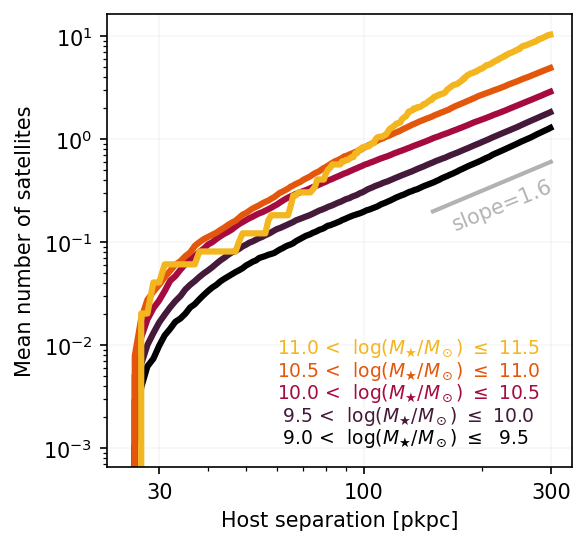

In [49]:
fig, ax = plt.subplots(1, 1, figsize=(4, 4), dpi=150)

radius_range = np.arange(25, 300, 1)

# loop through mass bins
for i, (m1, m2, color) in enumerate(
    zip(
        np.arange(9, 11.5, 0.5), 
        np.arange(9.5, 12, 0.5), 
        cmr.ember(np.linspace(0, 0.9, 5)), 
    )
):

    in_mass_range = (shdf.mass_NSA > 10**m1) & (shdf.mass_NSA <= 10**m2)

    N_sats = sum(in_mass_range)
    N_hosts = sum((host_df.mass > 10**m1) & (host_df.mass < 10**m2)) # number of hosts (including those that don't contain satellites)

    print(N_sats, N_hosts)

    cdf_sat = np.array([
        sum(shdf[in_mass_range].host_distance < r) / N_hosts \
            for r in radius_range
    ])
        
    ax.plot(radius_range, cdf_sat, color=color, lw=3)
    
    ax.text(60, 10**(-2.9+i*0.22), f'{m1:>4.1f} <  log($M_★/M_\odot$) $\leq$ {m2:>4.1f}', color=color, va='center',fontsize=9)

ax.set_xscale('log')
ax.set_yscale('log')

# plot loglog slope = 1.6
x = np.array([150, 300])
y = 0.2*(x/x[0])**1.6
ax.plot(x, y, c='k', alpha=0.3, lw=2)
ax.text(1.5*x[0], 2.2*y[0], 'slope=1.6', c='k', ha='center', va='top', alpha=0.3, rotation=22)

plt.xticks([30, 100, 300], [30, 100, 300])

ax.set_xlabel('Host separation [pkpc]')
ax.set_ylabel('Mean number of satellites')

ax.grid(alpha=0.1)

plt.savefig(fig_dir/'satellite-radial-distribution_loglog_a.png')

8141 6244
8984 5585
11468 5074
10974 3216
4195 756
512 48


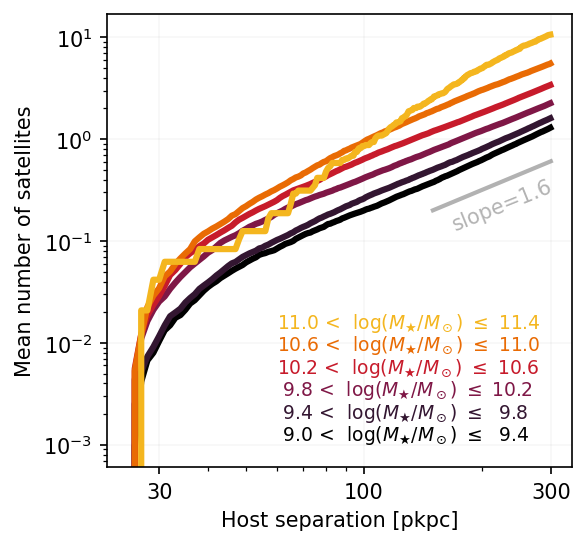

In [50]:
fig, ax = plt.subplots(1, 1, figsize=(4, 4), dpi=150)

radius_range = np.arange(25, 300, 1)

# loop through mass bins
for i, (m1, m2, color) in enumerate(
    zip(
        np.arange(9, 11.4, 0.4), 
        np.arange(9.4, 11.8, 0.4), 
        cmr.ember(np.linspace(0, 0.9, 6)), 
    )
):

    in_mass_range = (shdf.mass_NSA > 10**m1) & (shdf.mass_NSA <= 10**m2)

    N_sats = sum(in_mass_range)
    N_hosts = sum((host_df.mass > 10**m1) & (host_df.mass < 10**m2)) # number of hosts (including those that don't contain satellites)

    print(N_sats, N_hosts)

    cdf_sat = np.array([
        sum(shdf[in_mass_range].host_distance < r) / N_hosts \
            for r in radius_range
    ])
        
    ax.plot(radius_range, cdf_sat, color=color, lw=3)
    
    ax.text(60, 10**(-2.9+i*0.22), f'{m1:>4.1f} <  log($M_★/M_\odot$) $\leq$ {m2:>4.1f}', color=color, va='center',fontsize=9)

ax.set_xscale('log')
ax.set_yscale('log')

# plot loglog slope = 1.6
x = np.array([150, 300])
y = 0.2*(x/x[0])**1.6
ax.plot(x, y, c='k', alpha=0.3, lw=2)
ax.text(1.5*x[0], 2.2*y[0], 'slope=1.6', c='k', ha='center', va='top', alpha=0.3, rotation=22)

plt.xticks([30, 100, 300], [30, 100, 300])

ax.set_xlabel('Host separation [pkpc]')
ax.set_ylabel('Mean number of satellites')

ax.grid(alpha=0.1)

plt.savefig(fig_dir/'satellite-radial-distribution_loglog_b.png')

5051 4046
4944 3627
5846 3459
6772 3381
7521 2931
7350 2167
4447 981
1831 283
495 43


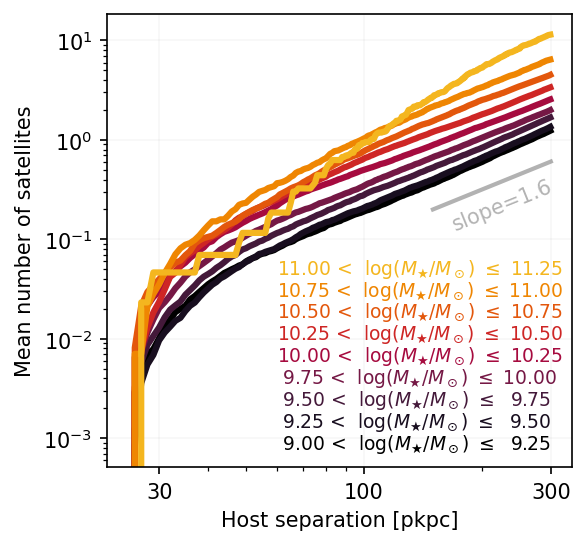

In [51]:
fig, ax = plt.subplots(1, 1, figsize=(4, 4), dpi=150)

radius_range = np.arange(25, 300, 1)

# loop through mass bins
for i, (m1, m2, color) in enumerate(
    zip(
        np.arange(9, 11.25, 0.25), 
        np.arange(9.25, 11.5, 0.25), 
        cmr.ember(np.linspace(0, 0.9, 9)), 
    )
):

    in_mass_range = (shdf.mass_NSA > 10**m1) & (shdf.mass_NSA <= 10**m2)

    N_sats = sum(in_mass_range)
    N_hosts = sum((host_df.mass > 10**m1) & (host_df.mass < 10**m2)) # number of hosts (including those that don't contain satellites)

    print(N_sats, N_hosts)

    cdf_sat = np.array([
        sum(shdf[in_mass_range].host_distance < r) / N_hosts \
            for r in radius_range
    ])
        
    ax.plot(radius_range, cdf_sat, color=color, lw=3)
    
    ax.text(60, 10**(-3.05+i*0.22), f'{m1:>5.2f} <  log($M_★/M_\odot$) $\leq$ {m2:>5.2f}', color=color, va='center',fontsize=9)

ax.set_xscale('log')
ax.set_yscale('log')

# plot loglog slope = 1.6
x = np.array([150, 300])
y = 0.2*(x/x[0])**1.6
ax.plot(x, y, c='k', alpha=0.3, lw=2)
ax.text(1.5*x[0], 2.2*y[0], 'slope=1.6', c='k', ha='center', va='top', alpha=0.3, rotation=22)

plt.xticks([30, 100, 300], [30, 100, 300])

ax.set_xlabel('Host separation [pkpc]')
ax.set_ylabel('Mean number of satellites')

ax.grid(alpha=0.1)

plt.savefig(fig_dir/'satellite-radial-distribution_loglog_c.png')

# Is the dip due to overlapping halos? (No)

For example, cluster galaxies are massive, and they tend to be next to each other. Perhaps these satellites would typically be double- or triple-counted, and we've removed that. In order to check, we need to return to **Section 4** and redo the host-satellite matching *without* correcting for double-counting

## Assign satellites in overlapping halos to multiple hosts (incorrectly)

Redoing Section **4.1** incorrectly

In [8]:
sat_coords = SkyCoord(sat_x_nsa.ra, sat_x_nsa.dec, unit='deg')

nsa_coords = SkyCoord(nsa.ra_NSA, nsa.dec_NSA, unit='deg')

_, angsep, _ = nsa_coords.match_to_catalog_sky(sat_coords)

sep = (cosmo.angular_diameter_distance(nsa.z_NSA).to(u.kpc) * angsep.to(u.rad)).value


In [9]:
hosts = nsa[sep < 300].copy()
hosts = hosts[(hosts.mass_NSA < 1e14) & (hosts.mass_NSA > 1e9) & (hosts.z_NSA < 0.03) & (hosts.z_NSA > 0.005)].copy()

hosts.sort_values('mass_NSA', ascending=False, inplace=True)

Section **4.2**, incorrectly

In [12]:
overcounted_host_dict = dict()

distances = -1 * np.ones(len(sat_x_nsa), dtype=float)

for host in tqdm(hosts.itertuples(), total=len(hosts)):
    nsaid, z, ra, dec, M_r, mass = host
    
    host_coords = SkyCoord(ra, dec, unit='deg')
    host_sep = host_coords.separation(sat_coords)
    
    kpc_per_deg = cosmo.angular_diameter_distance(z).to(u.kpc).value * np.pi / 180 

    # note: could change 300 kpc to something that scales with host mass 
    in_host = (host_sep.to(u.deg).value * kpc_per_deg < 300) & (host_sep.to(u.deg).value * kpc_per_deg > 25)
    
    new_sats_in_host = sat_x_nsa[in_host]
    
    host_NSAID[in_host] = nsaid 
    distances[in_host] = host_sep[in_host] * kpc_per_deg
    
    n_sat_in_300kpc = len(new_sats_in_host)
    overcounted_host_dict[nsaid] = [ra, dec, z, M_r, mass, n_sat_in_300kpc]


## Plot host-satellite occupation, with duplicates

Based on Section **5**

In [25]:
overcounted_host_df = pd.DataFrame.from_dict(
    overcounted_host_dict, 
    orient='index', 
    columns=['ra', 'dec', 'z', 'M_r', 'mass', 'n_sat_in_300kpc'],
)
overcounted_host_df.index.name = 'NSAID'

# overcounted_host_df.to_csv(results_dir/'xSAGA-medium/overcounted_host_df.csv')

**OBVIOUSLY WRONG: overcounted satellites in hosts**

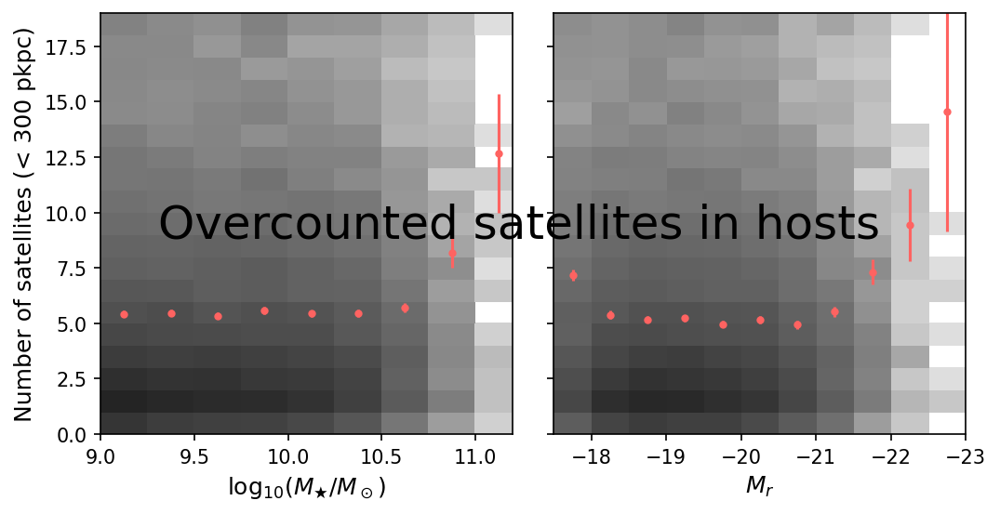

In [27]:
fig, [ax1, ax2] = plt.subplots(1, 2, figsize=(8, 4), dpi=150, sharey=True)

# plot stellar mass
mass_bins = np.arange(9., 11.5, 0.25)
ax1.hist2d(overcounted_host_df.mass.apply(np.log10), overcounted_host_df.n_sat_in_300kpc, bins=(mass_bins, np.arange(0, 20)), cmap='Greys', norm=LogNorm(0.1, 3e3))

boot_n_sat = np.array([
    bootstrap(
        overcounted_host_df.n_sat_in_300kpc[(overcounted_host_df.mass > 10**m1) & (overcounted_host_df.mass < 10**m2)].values,
        bootfunc=np.mean,
    ) for m1, m2 in zip(mass_bins[:-1], mass_bins[1:])]
)

ax1.errorbar(mass_bins[:-1]+0.125, boot_n_sat.mean(1), boot_n_sat.std(1), c=c3, marker='o', ls='', markersize=3)

ax1.set_xlim(9.0, 11.2)
ax1.set_ylim(-0.5, 20.5)
ax1.set_xlabel(r'$\log_{10}(M_★/M_\odot)$', fontsize=12)
ax1.set_ylabel('Number of satellites (< 300 pkpc)', fontsize=12);

# plot abs mag
mag_bins = np.arange(-23., -17, 0.5)

ax2.hist2d(overcounted_host_df.M_r, overcounted_host_df.n_sat_in_300kpc, edgecolors='none', bins=(mag_bins, np.arange(0, 20)), cmap='Greys', norm=LogNorm(0.1, 3e3))

boot_n_sat = np.array([
    bootstrap(
        overcounted_host_df.n_sat_in_300kpc[(overcounted_host_df.M_r > mag1) & (overcounted_host_df.M_r < mag2)].values,
        bootfunc=np.mean,
    ) for mag1, mag2 in zip(mag_bins[:-1], mag_bins[1:])]
)
ax2.errorbar(mag_bins[:-1]+.25, boot_n_sat.mean(1), boot_n_sat.std(1), c=c3, marker='o', ls='', markersize=3)

ax2.set_xlim(-17.5, -23.)
ax2.set_xlabel(r'$M_{r}$', fontsize=12)

fig.subplots_adjust(wspace=0.1)

fig.text(0.5, 0.5, 'Overcounted satellites in hosts', ha='center', va='center', fontsize=24, color='k');

## Overcounting (or duplication) factor as a function of mass

The above is pretty interesting. On average, there are ~5.5 satellites per host *when overcounted*, while we previously saw that the number went from about 1.2 (at log stellar mass LSM = 9), to 2.2 (at LSM = 10), to 4 at LSM = 10.5, and finally 10 at LSM = 11. Let's compute this more precisely.

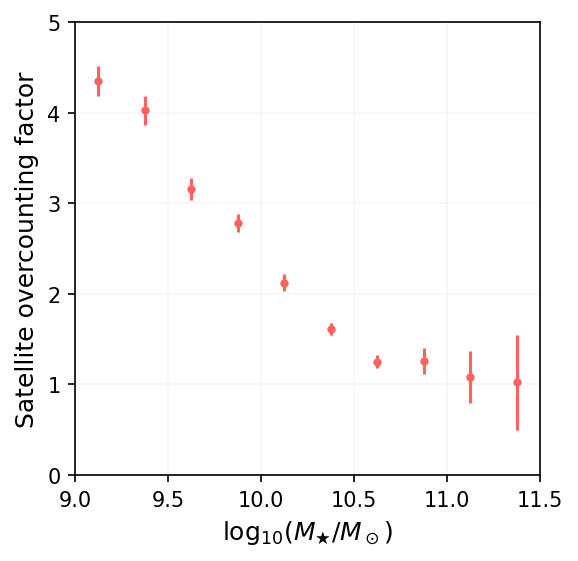

In [76]:
mass_bins = np.arange(9., 11.75, 0.25)

overcounted_boot_n_sat = np.array([
    bootstrap(
        overcounted_host_df.n_sat_in_300kpc[(overcounted_host_df.mass > 10**m1) & (overcounted_host_df.mass < 10**m2)].values,
        bootfunc=np.mean,
    ) for m1, m2 in zip(mass_bins[:-1], mass_bins[1:])]
)

boot_n_sat = np.array([
    bootstrap(
        host_df.n_sat_in_300kpc[(host_df.mass > 10**m1) & (host_df.mass < 10**m2)].values,
        bootfunc=np.mean,
    ) for m1, m2 in zip(mass_bins[:-1], mass_bins[1:])]
)

overcounting_ratio = overcounted_boot_n_sat.mean(1) / boot_n_sat.mean(1)
overcounting_ratio_err = overcounting_ratio * np.sqrt(
    (overcounted_boot_n_sat.std(1) / overcounted_boot_n_sat.mean(1))**2  +
    (boot_n_sat.std(1) / boot_n_sat.mean(1))**2 
)

# plotting
plt.figure(figsize=(4, 4), dpi=150)
plt.errorbar(mass_bins[:-1] + 0.125, overcounting_ratio, yerr=overcounting_ratio_err, c=c3, marker='o', ls='', markersize=3)

plt.xlim(9.0, 11.5)
plt.ylim(0, 5)
plt.xlabel(r'$\log_{10}(M_★/M_\odot)$', fontsize=12)
plt.ylabel('Satellite overcounting factor', fontsize=12)

plt.grid(alpha=0.1)


When we corrected for duplicates, we started from the most massive hosts, and moved our way down to the less massive halos (all the way down to LSM = 9). But now, when we're purposely overcounting duplicates, order doesn't matter. So it makes sense that overcounting is less of an issue at the high-mass end (something like 15-30% from LSM = 11.4 to 10.6).

## Number of halos with mass greater than log(M) per satellite

Another way to interpret this plot is **the number of halos with mass greater than log M that a single satellite can occupy**.

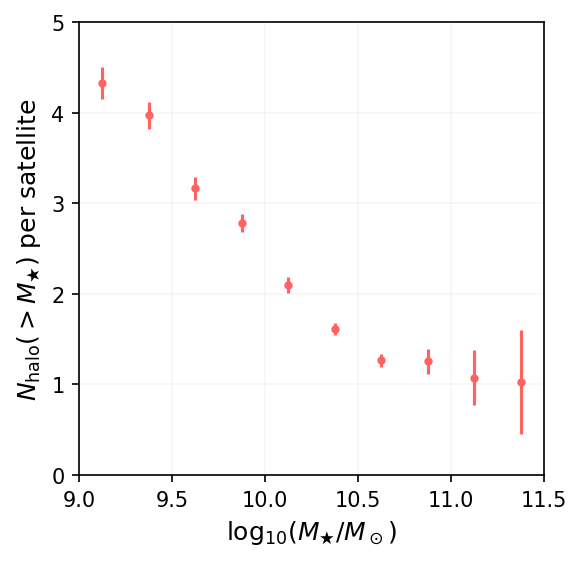

In [83]:
np.random.seed(1234)

mass_bins = np.arange(9., 11.75, 0.25)

overcounted_boot_n_sat = np.array([
    bootstrap(
        overcounted_host_df.n_sat_in_300kpc[(overcounted_host_df.mass > 10**m1) & (overcounted_host_df.mass < 10**m2)].values,
        bootfunc=np.mean,
    ) for m1, m2 in zip(mass_bins[:-1], mass_bins[1:])]
)

boot_n_sat = np.array([
    bootstrap(
        host_df.n_sat_in_300kpc[(host_df.mass > 10**m1) & (host_df.mass < 10**m2)].values,
        bootfunc=np.mean,
    ) for m1, m2 in zip(mass_bins[:-1], mass_bins[1:])]
)

overcounting_ratio = overcounted_boot_n_sat.mean(1) / boot_n_sat.mean(1)
overcounting_ratio_err = overcounting_ratio * np.sqrt(
    (overcounted_boot_n_sat.std(1) / overcounted_boot_n_sat.mean(1))**2  +
    (boot_n_sat.std(1) / boot_n_sat.mean(1))**2 
)

# plotting
plt.figure(figsize=(4, 4), dpi=150)
plt.errorbar(mass_bins[:-1] + 0.125, overcounting_ratio, yerr=overcounting_ratio_err, c=c3, marker='o', ls='', markersize=3)

plt.xlim(9.0, 11.5)
plt.ylim(0, 5)
plt.xlabel(r'$\log_{10}(M_★/M_\odot)$', fontsize=12)
plt.ylabel(r'$N_{\rm halo}(>M_★)$ per satellite', fontsize=12)

plt.grid(alpha=0.1)

plt.savefig(fig_dir/'N_halos_per_satellite.png')

**WIP: Plot radial distributions with overcounting**

From Section 6

I'll need to redo the assignment of satellites to hosts. But I can't populate a vector `distances` of shape `(N_sat,)` like before, since satellites aren't matched one-to-one with hosts. Instead I'll either need a matrix of shape `(N_sat, N_host)`, or simply save all satellite matches on the fly to each host. 

For now, it's not worth doing because my thesis that the dip in the LSM > 11 bin was attributed to overlapping cluster galaxies, while in practice, low-mass galaxies should experience the largest correction factor.

# Is the dip due to a few individual sources?

Examine individual raidal halo occupation curves

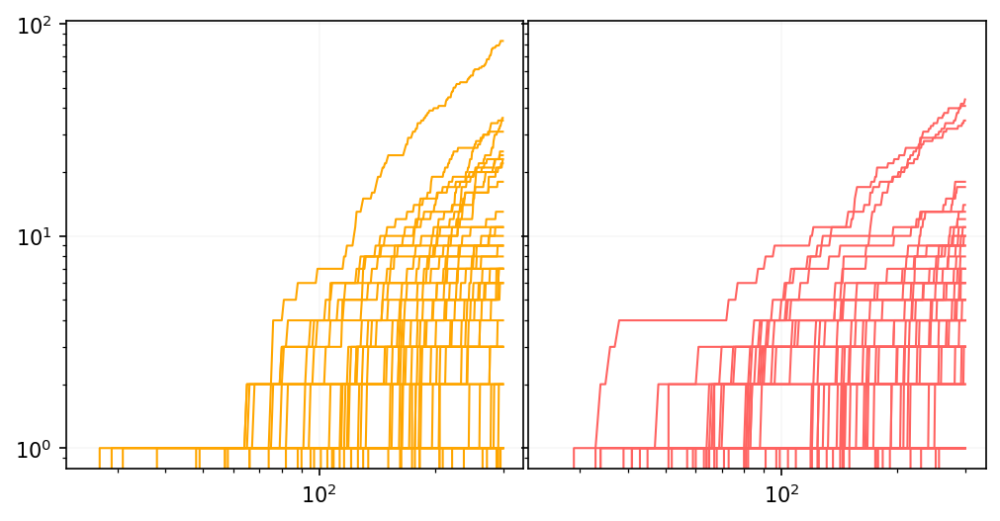

In [167]:
fig, [ax1, ax2] = plt.subplots(1, 2, figsize=(8, 4), dpi=150, sharey=True)

radius_range = np.arange(25, 300, 1)
for nsaid, group in shdf[(shdf.mass_NSA > 10**11) & (shdf.mass_NSA <= 10**11.5)].groupby('host_NSAID'):
    cdf_host = np.array([sum(group.host_distance < r) for r in radius_range])
    ax1.plot(radius_range, cdf_host, lw=1, c=c4)

    
for nsaid, group in shdf[(shdf.mass_NSA > 10**10.9) & (shdf.mass_NSA <= 10**11)].groupby('host_NSAID'):
    cdf_host = np.array([sum(group.host_distance < r) for r in radius_range])
    ax2.plot(radius_range, cdf_host, lw=1, c=c3)
    
ax1.set_xscale('log')
ax2.set_xscale('log')
ax2.set_yscale('log')

ax1.grid(alpha=0.1)
ax2.grid(alpha=0.1)

fig.subplots_adjust(wspace=0.01)

## Bootstrapped radial distribution of sources

Use a bootstrap to compute uncertainties. Plots should look like the *log-log* ones in **Section 6.3**.

### Only the highest mass bin

Note that this always maxes out at unity, since it's a cumulative distribution function.

513 49


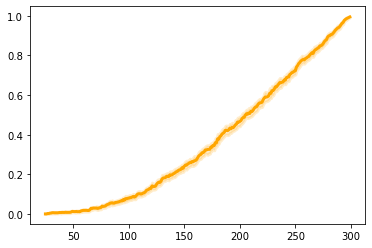

In [14]:
radius_range = np.arange(25, 300, 1)

m1, m2 = 11, 11.5

in_mass_range = (shdf.mass_NSA > 10**m1) & (shdf.mass_NSA <= 10**m2)

N_sats = sum(in_mass_range)
N_hosts = sum((host_df.mass > 10**m1) & (host_df.mass < 10**m2)) # number of hosts (including those that don't contain satellites)

print(N_sats, N_hosts)

cdf_sat = np.array([
    bootstrap(
        (shdf[in_mass_range].host_distance < r).values,
        bootnum=30,
        bootfunc=np.mean,
    ) for r in radius_range
])

plt.plot(radius_range, cdf_sat.mean(1), color=c4, lw=3)
plt.fill_between(radius_range, *np.quantile(cdf_sat, [0.16, 0.84], axis=1), color=c4, lw=3, alpha=0.2)

513 49


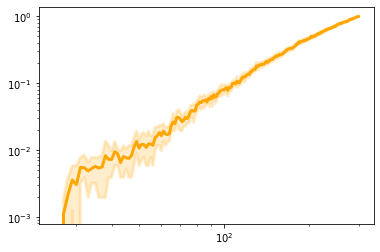

In [20]:
radius_range = np.arange(25, 300, 1)

m1, m2 = 11, 11.5

in_mass_range = (shdf.mass_NSA > 10**m1) & (shdf.mass_NSA <= 10**m2)

N_sats = sum(in_mass_range)
N_hosts = sum((host_df.mass > 10**m1) & (host_df.mass < 10**m2)) # number of hosts (including those that don't contain satellites)

print(N_sats, N_hosts)

cdf_sat = np.array([
    bootstrap(
        (shdf[in_mass_range].host_distance < r).values,
        bootnum=30,
        bootfunc=np.mean,
    ) for r in radius_range
])

plt.plot(radius_range, cdf_sat.mean(1), color=c4, lw=3)
plt.fill_between(radius_range, *np.quantile(cdf_sat, [0.16, 0.84], axis=1), color=c4, lw=3, alpha=0.2)

plt.xscale('log')
plt.yscale('log')

### CDF - All mass bins

9995 7673
12618 6840
14871 5098
6278 1264
513 49


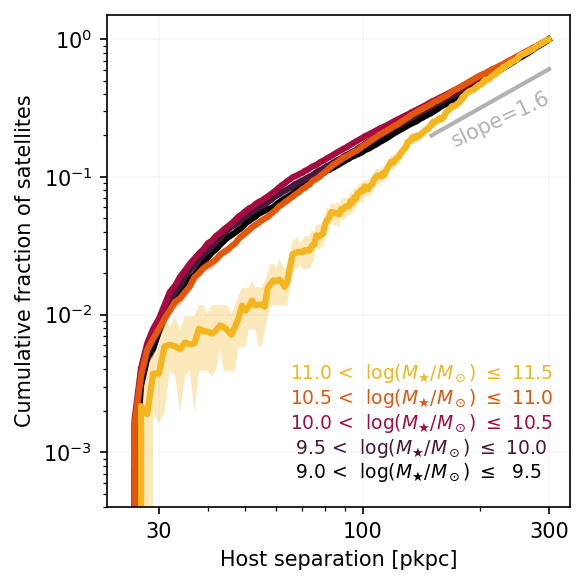

In [198]:
fig, ax = plt.subplots(1, 1, figsize=(4, 4), dpi=150)

radius_range = np.arange(25, 300, 1)

# loop through mass bins
for i, (m1, m2, color) in enumerate(
    zip(
        np.arange(9, 11.5, 0.5), 
        np.arange(9.5, 12, 0.5), 
        cmr.ember(np.linspace(0, 0.9, 5)), 
    )
):

    in_mass_range = (shdf.mass_NSA > 10**m1) & (shdf.mass_NSA <= 10**m2)

    N_sats = sum(in_mass_range)
    N_hosts = sum((host_df.mass > 10**m1) & (host_df.mass < 10**m2)) # number of hosts (including those that don't contain satellites)

    print(N_sats, N_hosts)

    cdf_sat = np.array([
        bootstrap(
            (shdf[in_mass_range].host_distance < r).values,
            bootnum=100,
            bootfunc=np.mean,
        ) for r in radius_range
    ])
    ax.plot(radius_range, cdf_sat.mean(1), color=color, lw=3)
    ax.fill_between(radius_range, *np.quantile(cdf_sat, [0.16, 0.84], axis=1), color=color, lw=0, alpha=0.3)
    
    ax.text(65, 10**(-3.15+i*0.18), f'{m1:>4.1f} <  log($M_★/M_\odot$) $\leq$ {m2:>4.1f}', color=color, va='center',fontsize=9)

ax.set_xscale('log')
ax.set_yscale('log')

# plot loglog slope = 1.6
x = np.array([150, 300])
y = 0.2*(x/x[0])**1.6
ax.plot(x, y, c='k', alpha=0.3, lw=2)
ax.text(1.5*x[0], 2.2*y[0], 'slope=1.6', c='k', ha='center', va='top', alpha=0.3, rotation=25)

ax.set_ylim(4e-4, 1.5)

plt.xticks([30, 100, 300], [30, 100, 300])

ax.set_xlabel('Host separation [pkpc]')
ax.set_ylabel('Cumulative fraction of satellites')

ax.grid(alpha=0.1)

fig.tight_layout()
plt.savefig(fig_dir/'radial-cdf_bootstrapped_loglog_a.png')

8141 6244
8984 5585
11468 5074
10974 3216
4195 756
512 48


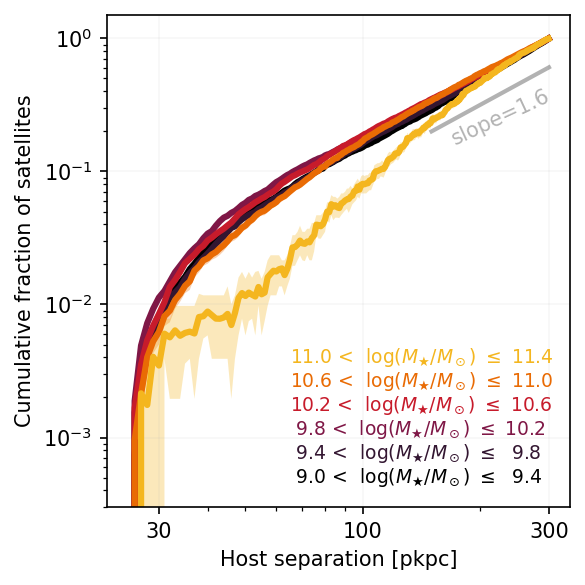

In [199]:
fig, ax = plt.subplots(1, 1, figsize=(4, 4), dpi=150)

radius_range = np.arange(25, 300, 1)

# loop through mass bins
for i, (m1, m2, color) in enumerate(
    zip(
        np.arange(9, 11.4, 0.4), 
        np.arange(9.4, 11.8, 0.4), 
        cmr.ember(np.linspace(0, 0.9, 6)), 
    )
):

    in_mass_range = (shdf.mass_NSA > 10**m1) & (shdf.mass_NSA <= 10**m2)

    N_sats = sum(in_mass_range)
    N_hosts = sum((host_df.mass > 10**m1) & (host_df.mass < 10**m2)) # number of hosts (including those that don't contain satellites)

    print(N_sats, N_hosts)

    cdf_sat = np.array([
        bootstrap(
            (shdf[in_mass_range].host_distance < r).values,
            bootnum=100,
            bootfunc=np.mean,
        ) for r in radius_range
    ])
    ax.plot(radius_range, cdf_sat.mean(1), color=color, lw=3)
    ax.fill_between(radius_range, *np.quantile(cdf_sat, [0.16, 0.84], axis=1), color=color, lw=0, alpha=0.3)
    
    ax.text(65, 10**(-3.3+i*0.18), f'{m1:>4.1f} <  log($M_★/M_\odot$) $\leq$ {m2:>4.1f}', color=color, va='center',fontsize=9)

ax.set_xscale('log')
ax.set_yscale('log')

x = np.array([150, 300])
y = 0.2*(x/x[0])**1.6
ax.plot(x, y, c='k', alpha=0.3, lw=2)
ax.text(1.5*x[0], 2.2*y[0], 'slope=1.6', c='k', ha='center', va='top', alpha=0.3, rotation=25)

ax.set_ylim(3e-4, 1.5)

plt.xticks([30, 100, 300], [30, 100, 300])

ax.set_xlabel('Host separation [pkpc]')
ax.set_ylabel('Cumulative fraction of satellites')

ax.grid(alpha=0.1)
fig.tight_layout()

fig.tight_layout()
plt.savefig(fig_dir/'radial-cdf_bootstrapped_loglog_b.png')

5051 4046
4944 3627
5846 3459
6772 3381
7521 2931
7350 2167
4447 981
1831 283
495 43


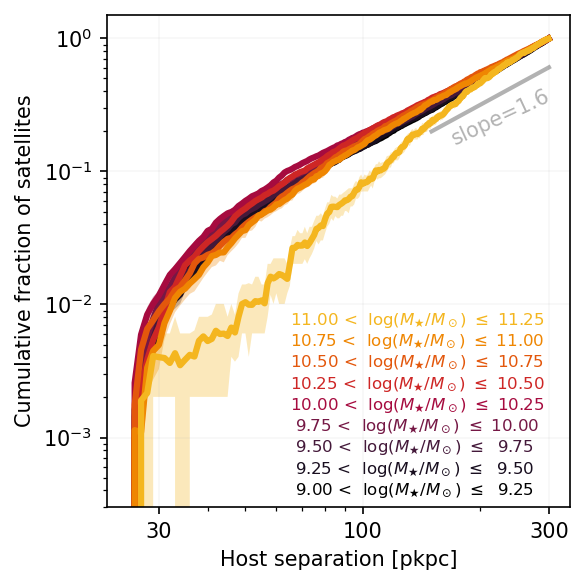

In [200]:
fig, ax = plt.subplots(1, 1, figsize=(4, 4), dpi=150)

radius_range = np.arange(25, 300, 1)

# loop through mass bins
for i, (m1, m2, color) in enumerate(
    zip(
        np.arange(9, 11.25, 0.25), 
        np.arange(9.25, 11.5, 0.25), 
        cmr.ember(np.linspace(0, 0.9, 9)), 
    )
):

    in_mass_range = (shdf.mass_NSA > 10**m1) & (shdf.mass_NSA <= 10**m2)

    N_sats = sum(in_mass_range)
    N_hosts = sum((host_df.mass > 10**m1) & (host_df.mass < 10**m2)) # number of hosts (including those that don't contain satellites)

    print(N_sats, N_hosts)

    cdf_sat = np.array([
        bootstrap(
            (shdf[in_mass_range].host_distance < r).values,
            bootnum=100,
            bootfunc=np.mean,
        ) for r in radius_range
    ])
    ax.plot(radius_range, cdf_sat.mean(1), color=color, lw=3)
    ax.fill_between(radius_range, *np.quantile(cdf_sat, [0.16, 0.84], axis=1), color=color, lw=0, alpha=0.3)
    
    ax.text(65, 10**(-3.4+i*0.16), f'{m1:>5.2f} <  log($M_★/M_\odot$) $\leq$ {m2:>5.2f}', color=color, va='center',fontsize=8)

ax.set_xscale('log')
ax.set_yscale('log')

x = np.array([150, 300])
y = 0.2*(x/x[0])**1.6
ax.plot(x, y, c='k', alpha=0.3, lw=2)
ax.text(1.5*x[0], 2.2*y[0], 'slope=1.6', c='k', ha='center', va='top', alpha=0.3, rotation=25)

ax.set_ylim(3e-4, 1.5)

plt.xticks([30, 100, 300], [30, 100, 300])

ax.set_xlabel('Host separation [pkpc]')
ax.set_ylabel('Cumulative fraction of satellites')

ax.grid(alpha=0.1)

fig.tight_layout()
plt.savefig(fig_dir/'radial-cdf_bootstrapped_loglog_c.png')

### Mean number of satellites - All mass bins

This is more of a sanity check.

9995 7673
12618 6840
14871 5098
6278 1264
513 49


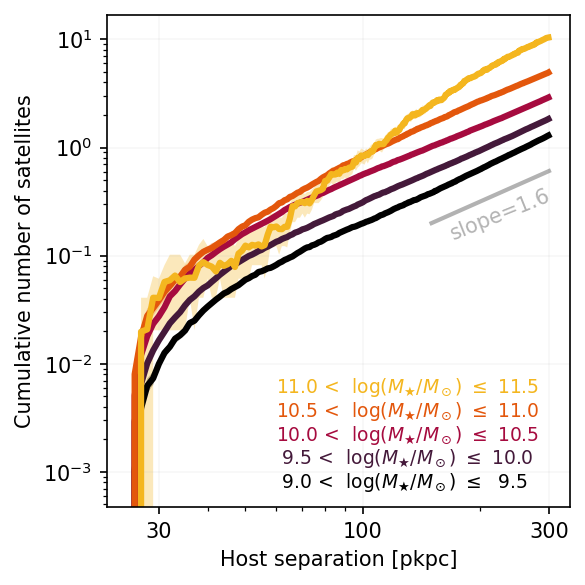

In [201]:
fig, ax = plt.subplots(1, 1, figsize=(4, 4), dpi=150)

radius_range = np.arange(25, 300, 1)

# loop through mass bins
for i, (m1, m2, color) in enumerate(
    zip(
        np.arange(9, 11.5, 0.5), 
        np.arange(9.5, 12, 0.5), 
        cmr.ember(np.linspace(0, 0.9, 5)), 
    )
):

    in_mass_range = (shdf.mass_NSA > 10**m1) & (shdf.mass_NSA <= 10**m2)

    N_sats = sum(in_mass_range)
    N_hosts = sum((host_df.mass > 10**m1) & (host_df.mass < 10**m2)) # number of hosts (including those that don't contain satellites)

    print(N_sats, N_hosts)

    cdf_sat = np.array([
        bootstrap(
            (shdf[in_mass_range].host_distance < r).values,
            bootnum=100,
            bootfunc=np.mean,
        ) for r in radius_range
    ]) * N_sats / N_hosts
    
    ax.plot(radius_range, cdf_sat.mean(1), color=color, lw=3)
    ax.fill_between(radius_range, *np.quantile(cdf_sat, [0.16, 0.84], axis=1), color=color, lw=0, alpha=0.3)
    
    ax.text(60, 10**(-3.1+i*0.22), f'{m1:>4.1f} <  log($M_★/M_\odot$) $\leq$ {m2:>4.1f}', color=color, va='center',fontsize=9)

ax.set_xscale('log')
ax.set_yscale('log')

# plot loglog slope = 1.75
x = np.array([150, 300])
y = 0.2*(x/x[0])**1.6
ax.plot(x, y, c='k', alpha=0.3, lw=2)
ax.text(1.5*x[0], 2.2*y[0], 'slope=1.6', c='k', ha='center', va='top', alpha=0.3, rotation=22)

plt.xticks([30, 100, 300], [30, 100, 300])

ax.set_xlabel('Host separation [pkpc]')
ax.set_ylabel('Cumulative number of satellites')

ax.grid(alpha=0.1)

fig.tight_layout()
plt.savefig(fig_dir/'satellite-radial-distribution_bootstrapped_loglog_a.png')

# Cumulative number of satellites per halo as a function of mass

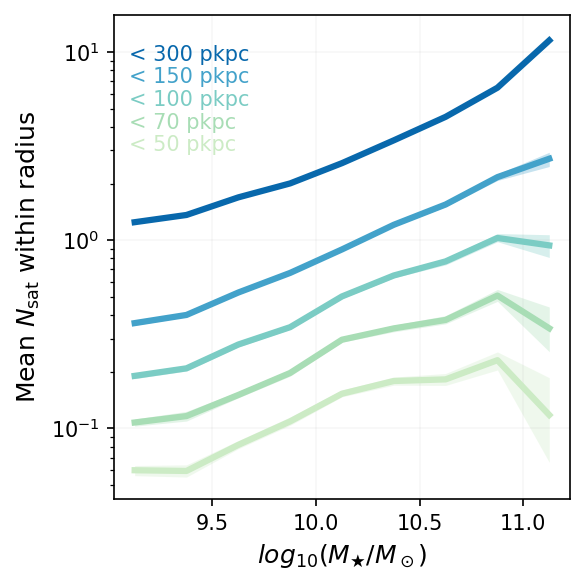

In [193]:
fig, ax = plt.subplots(1, 1, figsize=(4, 4), dpi=150)

mass_range = np.arange(9, 11.5, 0.25)
radius_range = [50, 70, 100, 150, 300]
colors = ['#ccebc5', '#a8ddb5', '#7bccc4', '#43a2ca', '#0868ac', ]
for i, (max_radius, color) in enumerate(zip(radius_range, colors)):

    within_radius = (shdf.host_distance < max_radius)

    boot_cdf_sat = np.array([
        bootstrap(
            ((shdf[within_radius].mass_NSA > 10**m1) & (shdf[within_radius].mass_NSA <= 10**m2)).values,
            bootnum=100,
            bootfunc=np.sum,
        ) for m1, m2 in zip(mass_range[:-1], mass_range[1:])
    ])
    
    N_hosts_in_mass_bins = np.array([
        sum((host_df.mass > 10**m1) & (host_df.mass <= 10**m2)) \
        for m1, m2 in zip(mass_range[:-1], mass_range[1:])
    ])
    
    boot_cdf_sat /= np.expand_dims(N_hosts_in_mass_bins, axis=1)


    ax.plot(mass_range[:-1]+0.125, boot_cdf_sat.mean(1), color=color, lw=3)
    ax.fill_between(mass_range[:-1]+0.125, *np.quantile(boot_cdf_sat, [0.16, 0.84], axis=1), color=color, lw=0, alpha=0.3)

    ax.text(9.1, 3.2*10**(i*0.12), f'< {max_radius:d} pkpc', color=color, va='center', fontsize=10)

        
ax.set_xlabel(r'$log_{10}(M_★/M_\odot)$', fontsize=12)
ax.set_ylabel(r'Mean $N_{\rm sat}$ within radius', fontsize=12)

ax.grid(alpha=0.1)

ax.set_yscale('log')

fig.tight_layout()
plt.savefig(fig_dir/'satellite-mass-distribution_by_radius.png')

# Spatial location of hosts by mass

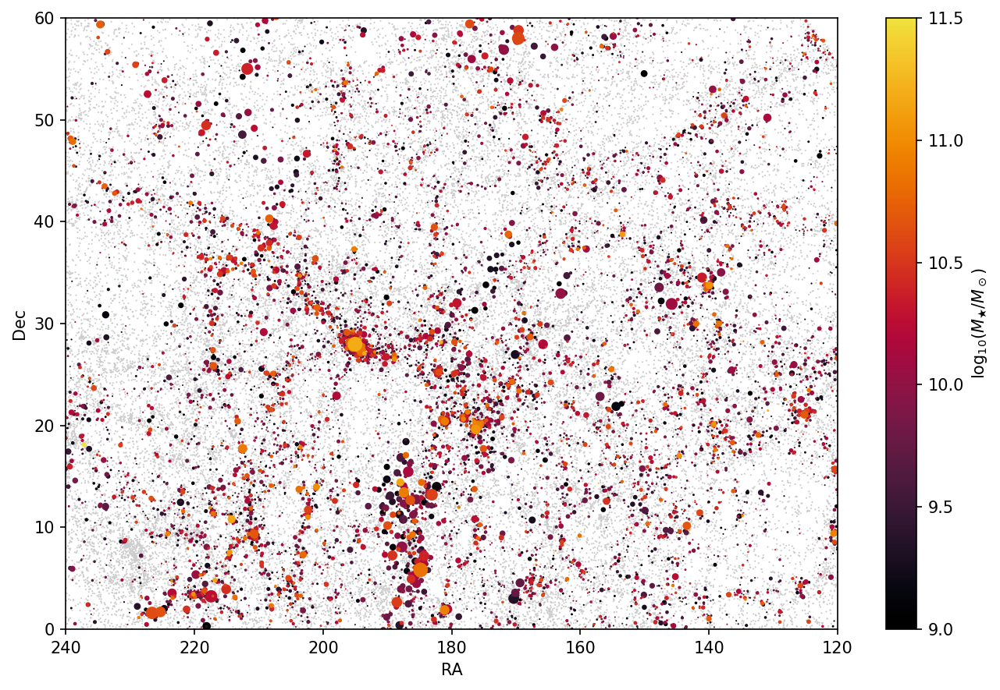

In [194]:
fig, ax = plt.subplots(1, 1, figsize=(9, 6), dpi=150)

host_df = host_df.sort_values('mass')

# satellites not in hosts
ax.scatter(shdf[shdf.host_NSAID == -1].ra, shdf[shdf.host_NSAID == -1].dec, color='0.8', edgecolor='none', s=1)

# hosts
sc = ax.scatter(host_df.ra, host_df.dec, s=host_df.n_sat_in_300kpc, c=host_df.mass.apply(np.log10), edgecolors='none', vmin=9, vmax=11.5, cmap=cmr.ember)
    
fig.colorbar(sc, label=r'$\log_{10}(M_★/M_\odot)$')
    
ax.set_xlim(240, 120)
ax.set_ylim(0, 60)

ax.set_xlabel('RA')
ax.set_ylabel('Dec');

fig.tight_layout()

We can see some overdensities in the satellite candidates -- those mostly are due to NSA objects that are at $z \approx 0.04$.

This actually begs the question: should we grab hosts out to $z = 0.04$ and then assign "satellite" candidates to these higher-redshift hosts, and see if results change?

# Satellite color vs host mass: **Galactic Conformity?**

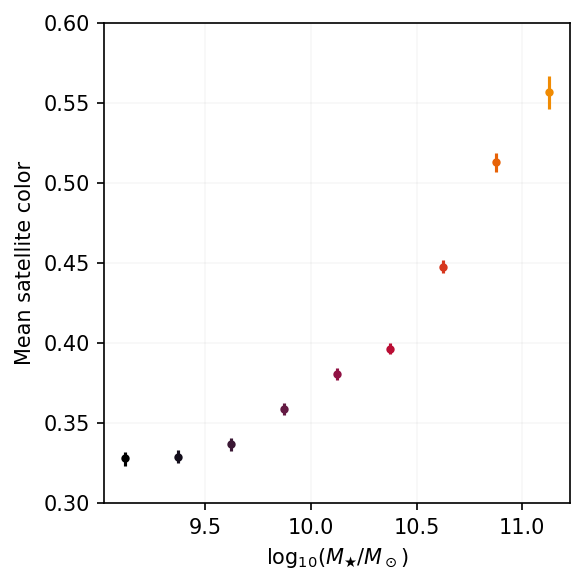

In [211]:
fig, ax = plt.subplots(1, 1, figsize=(4, 4), dpi=150)

# loop through mass bins
for i, (m1, m2, color) in enumerate(
    zip(
        np.arange(9, 11.25, 0.25), 
        np.arange(9.25, 11.5, 0.25), 
        cmr.ember(np.linspace(0, 0.9, 10)), 
    )
):

    boot_color = bootstrap(
        (shdf[(shdf.mass_NSA > 10**m1) & (shdf.mass_NSA <= 10**m2)].g0 - shdf[(shdf.mass_NSA > 10**m1) & (shdf.mass_NSA <= 10**m2)].r0).values,
        bootnum=1000,
        bootfunc=np.mean,
    )

    
    sat_color_16, sat_color_50, sat_color_84 = np.percentile(boot_color, [16, 50, 84])
        
    ax.errorbar(
        (m1+m2)/2, 
        sat_color_50, 
        yerr=np.array([[sat_color_50 - sat_color_16, sat_color_84 - sat_color_50]]).T, 
        color=color, 
        markersize=3, 
        marker='o'
    )
    
    
ax.set_xlabel(r'$\log_{10}(M_★/M_\odot)$')
ax.set_ylabel('Mean satellite color')

ax.set_ylim(0.3, 0.6)

ax.grid(alpha=0.1)

fig.tight_layout()
plt.savefig(fig_dir/'satellite_color_with_host_mass.png')

# Other properties vs host mass

In [233]:
shdf['DIST'] = cosmo.luminosity_distance(shdf.z_NSA_HOST).to(u.Mpc).value
shdf['M_r'] = shdf.r0 - 5*np.log10(shdf.DIST*1e6) + 5
shdf['logmass_sat'] = 1.254 + 1.098*(shdf.g0-sdf.r0) - 0.4*shdf.M_r

shdf['R_physical'] = (shdf.R_eff.values * u.arcsec).to(u.radian).value * shdf.DIST*1e3

In [235]:
# shdf.to_csv(results_dir/'xSAGA-medium/sats_hosts_x_nsa.csv')

## Satellite angular size

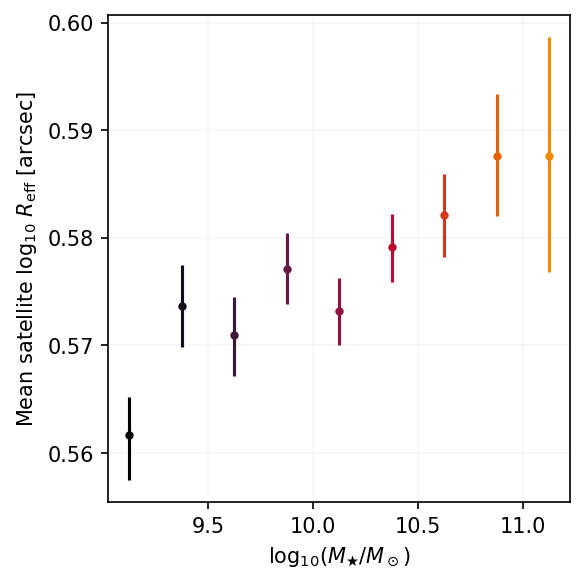

In [239]:
fig, ax = plt.subplots(1, 1, figsize=(4, 4), dpi=150)

# loop through mass bins
for i, (m1, m2, color) in enumerate(
    zip(
        np.arange(9, 11.25, 0.25), 
        np.arange(9.25, 11.5, 0.25), 
        cmr.ember(np.linspace(0, 0.9, 10)), 
    )
):

    boot_logR = bootstrap(
        shdf[(shdf.mass_NSA > 10**m1) & (shdf.mass_NSA <= 10**m2)].R_eff.apply(np.log10).values,
        bootnum=1000,
        bootfunc=np.nanmean,
    )

    
    logR_16, logR_50, logR_84 = np.percentile(boot_logR, [16, 50, 84])
        
    ax.errorbar(
        (m1+m2)/2, 
        logR_50, 
        yerr=np.array([[logR_50 - logR_16, logR_84 - logR_50]]).T, 
        color=color, 
        markersize=3, 
        marker='o'
    )
    
    
ax.set_xlabel(r'$\log_{10}(M_★/M_\odot)$')
ax.set_ylabel(r'Mean satellite $\log_{10}\ R_{\rm eff}$ [arcsec]')

ax.grid(alpha=0.1)


fig.tight_layout()


## Satellite physical size

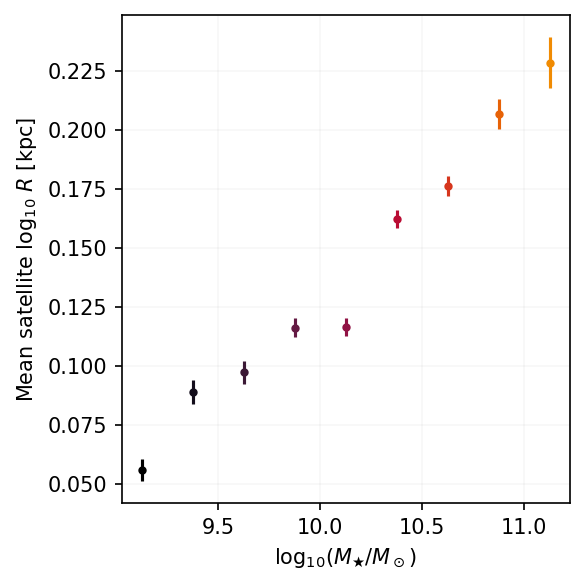

In [240]:
fig, ax = plt.subplots(1, 1, figsize=(4, 4), dpi=150)

# loop through mass bins
for i, (m1, m2, color) in enumerate(
    zip(
        np.arange(9, 11.25, 0.25), 
        np.arange(9.25, 11.5, 0.25), 
        cmr.ember(np.linspace(0, 0.9, 10)), 
    )
):

    boot_logR = bootstrap(
        shdf[(shdf.mass_NSA > 10**m1) & (shdf.mass_NSA <= 10**m2)].R_physical.apply(np.log10).values,
        bootnum=1000,
        bootfunc=np.nanmean,
    )

    
    logR_16, logR_50, logR_84 = np.percentile(boot_logR, [16, 50, 84])
        
    ax.errorbar(
        (m1+m2)/2, 
        logR_50, 
        yerr=np.array([[logR_50 - logR_16, logR_84 - logR_50]]).T, 
        color=color, 
        markersize=3, 
        marker='o'
    )
    
    
ax.set_xlabel(r'$\log_{10}(M_★/M_\odot)$')
ax.set_ylabel(r'Mean satellite $\log_{10}\ R$ [kpc]')

ax.grid(alpha=0.1)


fig.tight_layout()


## Satellite surface brightness

In [203]:
shdf['mu_eff'] = shdf.r0 + 2.5*np.log10(2*np.pi*shdf.R_eff**2)

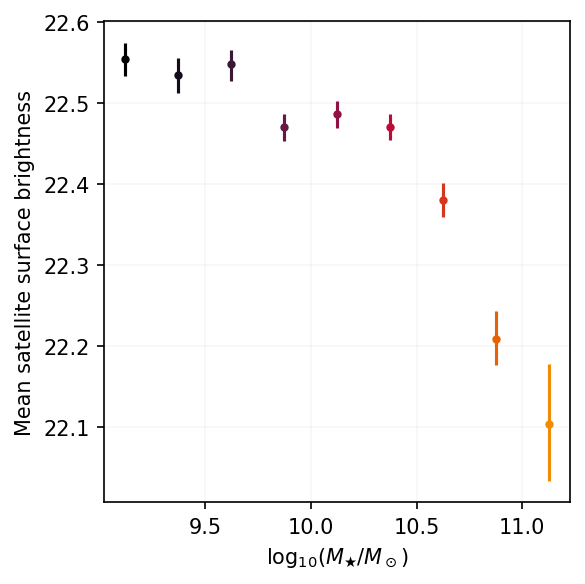

In [212]:
fig, ax = plt.subplots(1, 1, figsize=(4, 4), dpi=150)

# loop through mass bins
for i, (m1, m2, color) in enumerate(
    zip(
        np.arange(9, 11.25, 0.25), 
        np.arange(9.25, 11.5, 0.25), 
        cmr.ember(np.linspace(0, 0.9, 10)), 
    )
):

    boot_sb = bootstrap(
        shdf[(shdf.mass_NSA > 10**m1) & (shdf.mass_NSA <= 10**m2)].mu_eff.values,
        bootnum=1000,
        bootfunc=np.mean,
    )

    
    sb_16, sb_50, sb_84 = np.percentile(boot_sb, [16, 50, 84])
        
    ax.errorbar(
        (m1+m2)/2, 
        sb_50, 
        yerr=np.array([[sb_50 - sb_16, sb_84 - sb_50]]).T, 
        color=color, 
        markersize=3, 
        marker='o'
    )
    
    
ax.set_xlabel(r'$\log_{10}(M_★/M_\odot)$')
ax.set_ylabel('Mean satellite surface brightness')


ax.grid(alpha=0.1)

fig.tight_layout()
# plt.savefig(fig_dir/'satellite_surface_brightness_with_host_mass.png')

## Satellite stellar mass

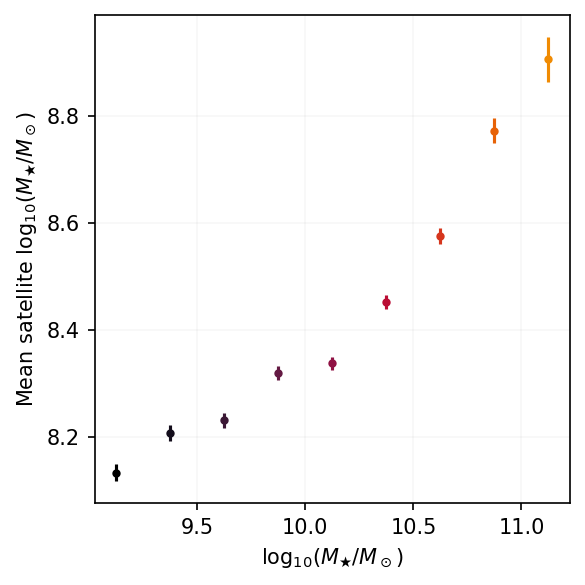

In [243]:
fig, ax = plt.subplots(1, 1, figsize=(4, 4), dpi=150)

# loop through mass bins
for i, (m1, m2, color) in enumerate(
    zip(
        np.arange(9, 11.25, 0.25), 
        np.arange(9.25, 11.5, 0.25), 
        cmr.ember(np.linspace(0, 0.9, 10)), 
    )
):

    boot_logM = bootstrap(
        shdf[(shdf.mass_NSA > 10**m1) & (shdf.mass_NSA <= 10**m2)].logmass_sat.values,
        bootnum=1000,
        bootfunc=np.nanmean,
    )

    
    logM_16, logM_50, logM_84 = np.percentile(boot_logM, [16, 50, 84])
        
    ax.errorbar(
        (m1+m2)/2, 
        logM_50, 
        yerr=np.array([[logM_50 - logM_16, logM_84 - logM_50]]).T, 
        color=color, 
        markersize=3, 
        marker='o'
    )
    
    
ax.set_xlabel(r'$\log_{10}(M_★/M_\odot)$')
ax.set_ylabel(r'Mean satellite $\log_{10}(M_★/M_\odot)$')

ax.grid(alpha=0.1)


fig.tight_layout()


## Satellite absolute magnitude

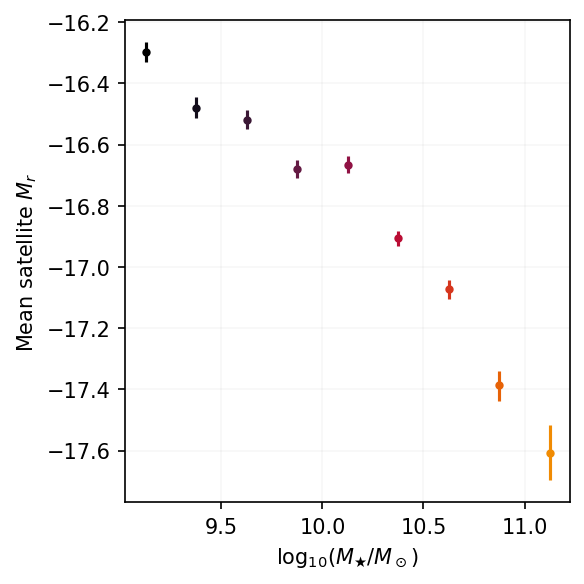

In [244]:
fig, ax = plt.subplots(1, 1, figsize=(4, 4), dpi=150)

# loop through mass bins
for i, (m1, m2, color) in enumerate(
    zip(
        np.arange(9, 11.25, 0.25), 
        np.arange(9.25, 11.5, 0.25), 
        cmr.ember(np.linspace(0, 0.9, 10)), 
    )
):

    boot_Mr = bootstrap(
        shdf[(shdf.mass_NSA > 10**m1) & (shdf.mass_NSA <= 10**m2)].M_r.values,
        bootnum=1000,
        bootfunc=np.nanmean,
    )

    
    Mr_16, Mr_50, Mr_84 = np.percentile(boot_Mr, [16, 50, 84])
        
    ax.errorbar(
        (m1+m2)/2, 
        Mr_50, 
        yerr=np.array([[Mr_50 - Mr_16, Mr_84 - Mr_50]]).T, 
        color=color, 
        markersize=3, 
        marker='o'
    )
    
    
ax.set_xlabel(r'$\log_{10}(M_★/M_\odot)$')
ax.set_ylabel(r'Mean satellite $M_r$')

ax.grid(alpha=0.1)


fig.tight_layout()


## Limiting satellite magnitude

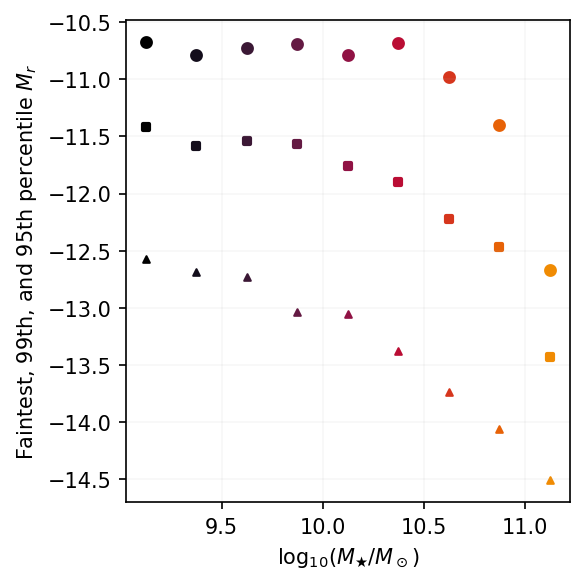

In [260]:
fig, ax = plt.subplots(1, 1, figsize=(4, 4), dpi=150)

# loop through mass bins
for i, (m1, m2, color) in enumerate(
    zip(
        np.arange(9, 11.25, 0.25), 
        np.arange(9.25, 11.5, 0.25), 
        cmr.ember(np.linspace(0, 0.9, 10)), 
    )
):

    mags = shdf[(shdf.mass_NSA > 10**m1) & (shdf.mass_NSA <= 10**m2)].M_r.values
        
    ax.scatter((m1+m2)/2, mags.max(), color=color, s=10, marker='o', lw=3)
    ax.scatter((m1+m2)/2, np.percentile(mags, 99), color=color, s=10, marker='s', lw=2)
    ax.scatter((m1+m2)/2, np.percentile(mags, 95), color=color, s=10, marker='^')
    
    
ax.set_xlabel(r'$\log_{10}(M_★/M_\odot)$')
ax.set_ylabel(r'Faintest, 99th, and 95th percentile $M_r$')

ax.grid(alpha=0.1)


fig.tight_layout()


# Satellite host properties using a **volume-limited sample**

In [263]:
# limiting mag
vldf = shdf[shdf.M_r < -12.3]

# vldf.to_csv(results_dir/'xSAGA-medium/volume-limited-satellites.csv')

## $(g-r)_0$

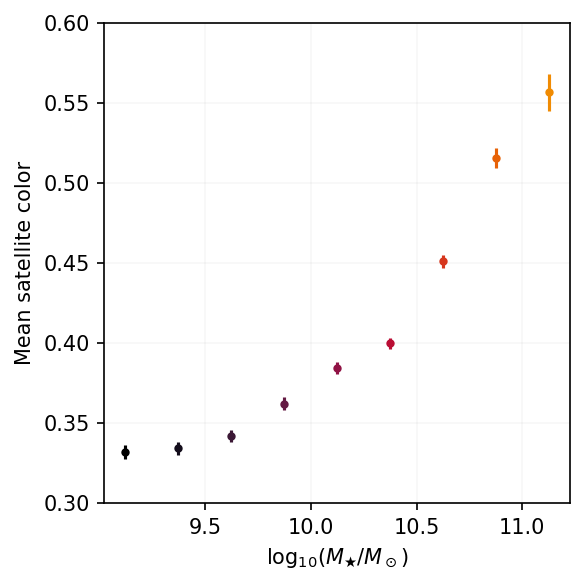

In [266]:
fig, ax = plt.subplots(1, 1, figsize=(4, 4), dpi=150)

# loop through mass bins
for i, (m1, m2, color) in enumerate(
    zip(
        np.arange(9, 11.25, 0.25), 
        np.arange(9.25, 11.5, 0.25), 
        cmr.ember(np.linspace(0, 0.9, 10)), 
    )
):

    boot_color = bootstrap(
        (vldf[(vldf.mass_NSA > 10**m1) & (vldf.mass_NSA <= 10**m2)].g0 - vldf[(vldf.mass_NSA > 10**m1) & (vldf.mass_NSA <= 10**m2)].r0).values,
        bootnum=1000,
        bootfunc=np.mean,
    )

    
    sat_color_16, sat_color_50, sat_color_84 = np.percentile(boot_color, [16, 50, 84])
        
    ax.errorbar(
        (m1+m2)/2, 
        sat_color_50, 
        yerr=np.array([[sat_color_50 - sat_color_16, sat_color_84 - sat_color_50]]).T, 
        color=color, 
        markersize=3, 
        marker='o'
    )
    
    
ax.set_xlabel(r'$\log_{10}(M_★/M_\odot)$')
ax.set_ylabel('Mean satellite color')

ax.set_ylim(0.3, 0.6)

ax.grid(alpha=0.1)

fig.tight_layout()
plt.savefig(fig_dir/'volume_limited-satellite_color_with_host_mass.png')

## Angular size

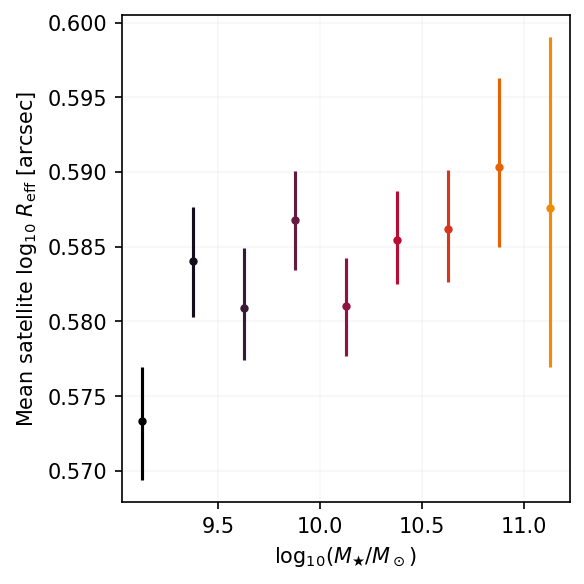

In [267]:
fig, ax = plt.subplots(1, 1, figsize=(4, 4), dpi=150)

# loop through mass bins
for i, (m1, m2, color) in enumerate(
    zip(
        np.arange(9, 11.25, 0.25), 
        np.arange(9.25, 11.5, 0.25), 
        cmr.ember(np.linspace(0, 0.9, 10)), 
    )
):

    boot_logR = bootstrap(
        vldf[(vldf.mass_NSA > 10**m1) & (vldf.mass_NSA <= 10**m2)].R_eff.apply(np.log10).values,
        bootnum=1000,
        bootfunc=np.nanmean,
    )

    
    logR_16, logR_50, logR_84 = np.percentile(boot_logR, [16, 50, 84])
        
    ax.errorbar(
        (m1+m2)/2, 
        logR_50, 
        yerr=np.array([[logR_50 - logR_16, logR_84 - logR_50]]).T, 
        color=color, 
        markersize=3, 
        marker='o'
    )
    
    
ax.set_xlabel(r'$\log_{10}(M_★/M_\odot)$')
ax.set_ylabel(r'Mean satellite $\log_{10}\ R_{\rm eff}$ [arcsec]')

ax.grid(alpha=0.1)


fig.tight_layout()


## Physical size

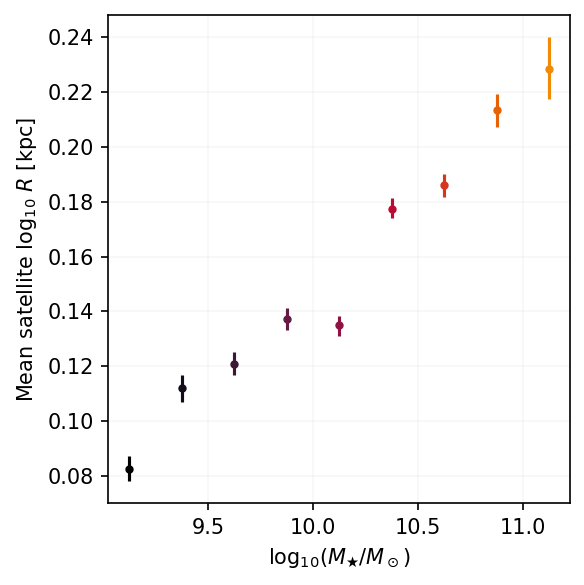

In [268]:
fig, ax = plt.subplots(1, 1, figsize=(4, 4), dpi=150)

# loop through mass bins
for i, (m1, m2, color) in enumerate(
    zip(
        np.arange(9, 11.25, 0.25), 
        np.arange(9.25, 11.5, 0.25), 
        cmr.ember(np.linspace(0, 0.9, 10)), 
    )
):

    boot_logR = bootstrap(
        vldf[(vldf.mass_NSA > 10**m1) & (vldf.mass_NSA <= 10**m2)].R_physical.apply(np.log10).values,
        bootnum=1000,
        bootfunc=np.nanmean,
    )

    
    logR_16, logR_50, logR_84 = np.percentile(boot_logR, [16, 50, 84])
        
    ax.errorbar(
        (m1+m2)/2, 
        logR_50, 
        yerr=np.array([[logR_50 - logR_16, logR_84 - logR_50]]).T, 
        color=color, 
        markersize=3, 
        marker='o'
    )
    
    
ax.set_xlabel(r'$\log_{10}(M_★/M_\odot)$')
ax.set_ylabel(r'Mean satellite $\log_{10}\ R$ [kpc]')

ax.grid(alpha=0.1)


fig.tight_layout()


## Surface brightness

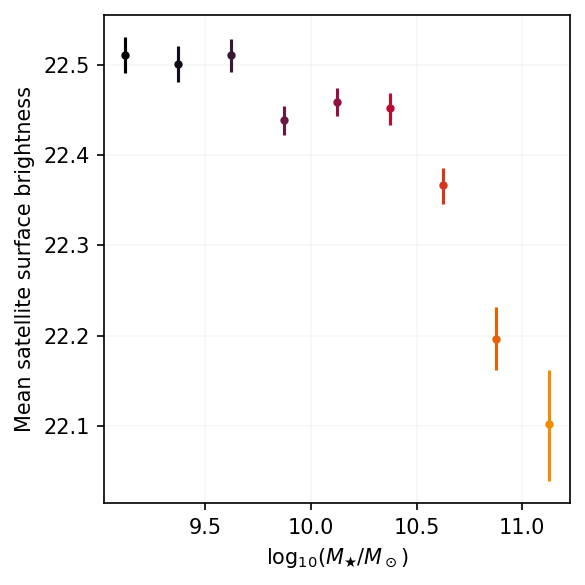

In [269]:
fig, ax = plt.subplots(1, 1, figsize=(4, 4), dpi=150)

# loop through mass bins
for i, (m1, m2, color) in enumerate(
    zip(
        np.arange(9, 11.25, 0.25), 
        np.arange(9.25, 11.5, 0.25), 
        cmr.ember(np.linspace(0, 0.9, 10)), 
    )
):

    boot_sb = bootstrap(
        vldf[(vldf.mass_NSA > 10**m1) & (vldf.mass_NSA <= 10**m2)].mu_eff.values,
        bootnum=1000,
        bootfunc=np.mean,
    )

    
    sb_16, sb_50, sb_84 = np.percentile(boot_sb, [16, 50, 84])
        
    ax.errorbar(
        (m1+m2)/2, 
        sb_50, 
        yerr=np.array([[sb_50 - sb_16, sb_84 - sb_50]]).T, 
        color=color, 
        markersize=3, 
        marker='o'
    )
    
    
ax.set_xlabel(r'$\log_{10}(M_★/M_\odot)$')
ax.set_ylabel('Mean satellite surface brightness')


ax.grid(alpha=0.1)

fig.tight_layout()

## Stellar mass

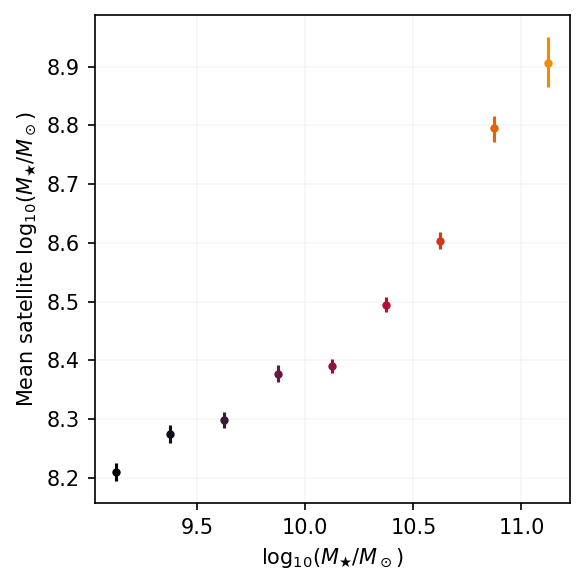

In [270]:
fig, ax = plt.subplots(1, 1, figsize=(4, 4), dpi=150)

# loop through mass bins
for i, (m1, m2, color) in enumerate(
    zip(
        np.arange(9, 11.25, 0.25), 
        np.arange(9.25, 11.5, 0.25), 
        cmr.ember(np.linspace(0, 0.9, 10)), 
    )
):

    boot_logM = bootstrap(
        vldf[(vldf.mass_NSA > 10**m1) & (vldf.mass_NSA <= 10**m2)].logmass_sat.values,
        bootnum=1000,
        bootfunc=np.nanmean,
    )

    
    logM_16, logM_50, logM_84 = np.percentile(boot_logM, [16, 50, 84])
        
    ax.errorbar(
        (m1+m2)/2, 
        logM_50, 
        yerr=np.array([[logM_50 - logM_16, logM_84 - logM_50]]).T, 
        color=color, 
        markersize=3, 
        marker='o'
    )
    
    
ax.set_xlabel(r'$\log_{10}(M_★/M_\odot)$')
ax.set_ylabel(r'Mean satellite $\log_{10}(M_★/M_\odot)$')

ax.grid(alpha=0.1)


fig.tight_layout()


## Satellite absolute magnitude

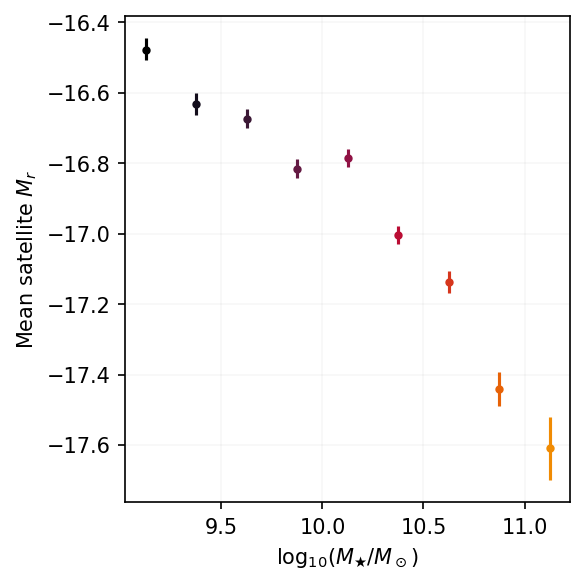

In [271]:
fig, ax = plt.subplots(1, 1, figsize=(4, 4), dpi=150)

# loop through mass bins
for i, (m1, m2, color) in enumerate(
    zip(
        np.arange(9, 11.25, 0.25), 
        np.arange(9.25, 11.5, 0.25), 
        cmr.ember(np.linspace(0, 0.9, 10)), 
    )
):

    boot_Mr = bootstrap(
        vldf[(vldf.mass_NSA > 10**m1) & (vldf.mass_NSA <= 10**m2)].M_r.values,
        bootnum=1000,
        bootfunc=np.nanmean,
    )

    
    Mr_16, Mr_50, Mr_84 = np.percentile(boot_Mr, [16, 50, 84])
        
    ax.errorbar(
        (m1+m2)/2, 
        Mr_50, 
        yerr=np.array([[Mr_50 - Mr_16, Mr_84 - Mr_50]]).T, 
        color=color, 
        markersize=3, 
        marker='o'
    )
    
    
ax.set_xlabel(r'$\log_{10}(M_★/M_\odot)$')
ax.set_ylabel(r'Mean satellite $M_r$')

ax.grid(alpha=0.1)


fig.tight_layout()


# Spatial location of (volume-limited) satellites

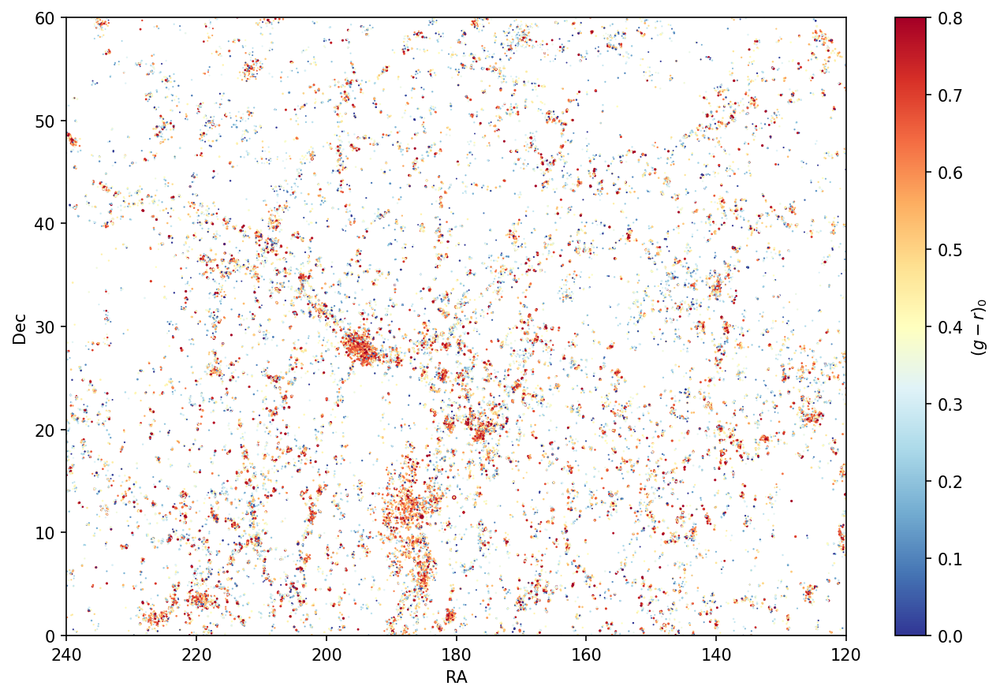

In [289]:
fig, ax = plt.subplots(1, 1, figsize=(9, 6), dpi=150)

# satellites not in hosts
# ax.scatter(vldf[vldf.host_NSAID == -1].ra, vldf[vldf.host_NSAID == -1].dec, color='0.8', edgecolor='none', s=1)

sc = ax.scatter(vldf.ra, vldf.dec, s=(vldf.logmass_sat / 7)**2, c=vldf.g0-vldf.r0, edgecolors='none', vmin=-0, vmax=0.8, cmap='RdYlBu_r')
    
fig.colorbar(sc, label=r'$(g-r)_0$')
    
ax.set_xlim(240, 120)
ax.set_ylim(0, 60)

ax.set_xlabel('RA')
ax.set_ylabel('Dec');

fig.tight_layout()

mass as color

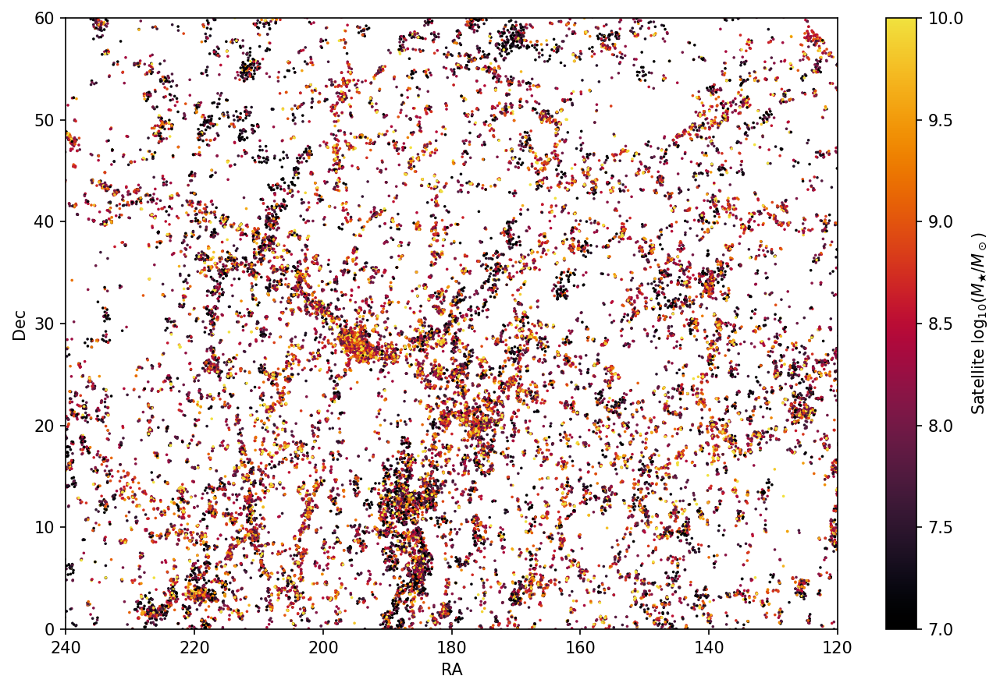

In [293]:
fig, ax = plt.subplots(1, 1, figsize=(9, 6), dpi=150)

# satellites not in hosts
# ax.scatter(vldf[vldf.host_NSAID == -1].ra, vldf[vldf.host_NSAID == -1].dec, color='0.8', edgecolor='none', s=1)

sc = ax.scatter(vldf.ra, vldf.dec, s=3, c=vldf.logmass_sat, edgecolor='none', vmin=7, vmax=10, cmap=cmr.ember)
    
fig.colorbar(sc, label=r'Satellite $\log_{10}(M_★/M_\odot)$')
    
ax.set_xlim(240, 120)
ax.set_ylim(0, 60)

ax.set_xlabel('RA')
ax.set_ylabel('Dec');

fig.tight_layout()

## Case studies

It would be interesting to look at some of these low-mass clumps of galaxies...

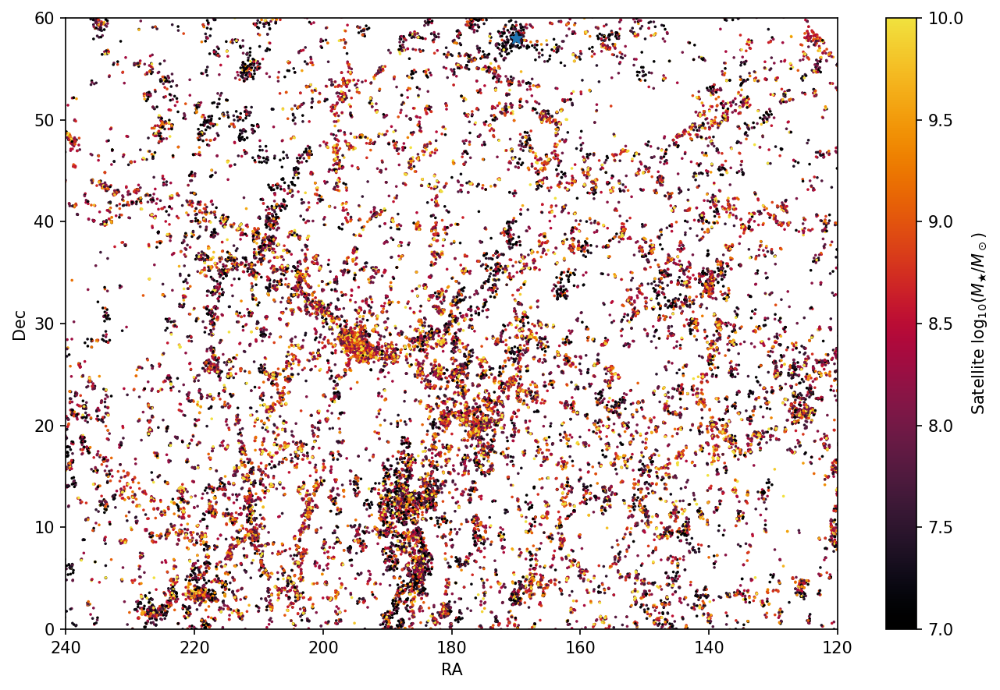

In [301]:
fig, ax = plt.subplots(1, 1, figsize=(9, 6), dpi=150)

sc = ax.scatter(vldf.ra, vldf.dec, s=3, c=vldf.logmass_sat, edgecolor='none', vmin=7, vmax=10, cmap=cmr.ember)
    
fig.colorbar(sc, label=r'Satellite $\log_{10}(M_★/M_\odot)$')

ax.scatter(170, 58, marker='*', s=50)

ax.set_xlim(240, 120)
ax.set_ylim(0, 60)

ax.set_xlabel('RA')
ax.set_ylabel('Dec');

fig.tight_layout()

~~Oh no, it's centered around a star!
https://www.legacysurvey.org/viewer/?ra=170.4543&dec=57.0743&layer=ls-dr9&zoom=11~~ 

Wait no, there's an few interesting shell galaxies in a group: https://www.legacysurvey.org/viewer/?ra=169.8418&dec=57.7584&layer=ls-dr9&zoom=11

In [319]:
location = SkyCoord(170, 58, unit=u.deg)

sat_coords = SkyCoord(vldf.ra, vldf.dec, unit=u.deg)

seps = sat_coords.separation(location)

temp = vldf.copy()
temp['sep_interest'] = seps
temp = temp.sort_values('sep_interest')
temp[temp.logmass_sat < 8][['ra', 'dec', 'z_NSA', 'sep_interest']].head(30)

,ra,dec,z_NSA,sep_interest
objID,,,,
1237658302207492313,170.025040,58.102982,0.017848,0.103831
1237658302207426864,169.911252,58.153403,0.017848,0.160420
1237657613411418216,170.110020,57.813134,0.006464,0.195795
1237657613411352701,169.770359,57.777542,0.004153,0.253749
1237657613411483841,170.406259,57.805440,0.006399,0.290607
1237655106764013855,170.551734,58.037523,0.021912,0.294620
1237657613411549241,170.533778,57.912884,0.010589,0.296298
1237658302207557890,170.284192,58.258711,0.017848,0.299077
1237658302207361491,169.430842,58.007746,0.006785,0.301674


And wow! Looks like a lot of cool dwarfs.